<a href="https://colab.research.google.com/github/JaviScG/JaviScG/blob/main/VC_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Visión por Computador - Práctica 1 - Filtrado de Imágenes

#### 12 puntos   |   Fecha de entrega: 03 de Noviembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: <mark>Javier Abril Román</mark>



---

## Normas de entrega

1. Para este trabajo, al igual que para los demás, se debe presentar código, resultados, discusión de los mismos, y presentación y análisis del trabajo realizado, todo integrado en el propio Google Colab Notebook (es decir, no se entrega ninguna memoria separada en `.pdf` ni ningún código `.py`). Se recuerda que código y resultados sin informe explicativo no puntúa.

2. En relación con el punto anterior, solo se acepta la entrega de ficheros `.ipynb` (no resulta válido entregar un fichero `.py`).

3. El diseño de celdas del documento debe ser respetado.

4. Solo se entregará el fichero `.ipynb` (incorporando código, resultados, y explicación del trabajo realizado y los resultados obtenidos) y no se enviarán las imágenes empleadas.

5. El path para la lectura de imágenes, o cualquier otro fichero de entrada, debe ser siempre “/content/drive/My Drive/images/nombre_fichero”

6. El código deberá  presentarse adecudamente comentado y con los resultados obtenidos en cada apartado, junto con la presentación del trabajo realizado y la discusión y análisis de los resultados obtenidos. Es importante reiterar que la entrega de código sin informe explicativo o valoraciones no puntúa. Por otro lado, el código debe ir comentado en comentarios en celdas de código, mientras que el análisis y discusión, tanto del trabajo realizado como de los resultados obtenidos, debe ir en celdas de texto.

Este trabajo de implementación tiene como objetivo principal **familiarizarse con la implementación y uso de filtros de convolución, así como del cálculo de las derivadas de una imagen y sus posibles aplicaciones**.








---



## Funciones de apoyo y conexión con Google Drive

In [ ]:
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# We import the modules to use
import os,sys
import cv2, numpy as np, math
from matplotlib import pyplot as plt
# change directory
%cd '/content/drive/My Drive/ColabNotebooks/images'
#  the current directory
%pwd

# This allows to display images  and to save  them in cells
%matplotlib inline


/content/drive/My Drive/ColabNotebooks/images


Las funciones que se incluyen a continuación, se proporcionan como ayuda/apoyo para el estudiante. **En caso de que el alumnado prefiera utilizar otras funciones para lectura, normalización y visualización de imágenes, tiene total libertad para hacerlo, pero sí debe justificar y explicar razonadamente el motivo de dicho cambio y describir las modificaciones realizadas.**

Recuérdese que todas las imágenes a emplear durante las prácticas de todo el curso se pueden encontrar en el enlace de Google Drive indicado en PRADO: https://pradogrado2425.ugr.es/mod/url/view.php?id=91457 En concreto, https://drive.google.com/drive/folders/1UtvY8q6w1Cz9a9T9zxIqSweoRLgNwoW-

In [ ]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [ ]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [ ]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:


im1=readIm(get_image('apple.jpg'),0)

displayIm(im1,'Manzana',0.5)
'''

def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [ ]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

IMPORTANT NOTE: it is important to notice that this function stacks all images
and later call displayIm(). This implies that the normalization (rangeDisplay01()) is done
at the very end of the process. As a consequence, if the stacked images have different
range values they can be displayed in a "weird" way (with black regions (pixel value = 0)
looking grey). In case the visualization seems to be a problem, a possible solution
would be to create vim using vim.append(rangeDisplay01(...)). In this way, all images
would be on the same range of values (negative values around 0 (black),
0 values around 0.5 (grey), and positive values closer to 1 (white))

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

# **Ejercicio 1: discretización de máscaras y filtrado Gaussiano** (6 puntos)

En este ejercicio aprenderemos a discretizar máscaras de convolución y a aplicarlas sobre imágenes empleando funciones de OpenCV. También buscamos hacerlo de un modo eficiente, y es por ello que, en toda la práctica, se exige el uso de convoluciones 1D (separables).





## A) (1.5 puntos)

En este apartado se deben realizar las siguientes tareas:

1. Calcular las máscaras discretas 1D de la Gaussiana, así como su primera y segunda derivadas (normalizadas), considerando que la entrada a dicha función de creación de máscaras 1D puede ser tanto un posible sigma como un posible tamaño de máscara.
2. Emplear los siguientes valores de sigma ($\{1, 1.5, 2.5, 6\}$) y los siguientes valores de tamaño de máscara ($\{7, 11, 15\}$), y mostrar el perfil (es decir, la silueta de las máscaras como funciones 1D) para verificar que las máscaras creadas son correctas.
3. Describir/explicar/analizar si las formas de dichos kernels tienen sentido y se corresponden con lo que esperaríamos ver.

In [ ]:
#Funcion Gaussiana
def GaussFunc(x, sigma):
    return np.exp(- (x**2) / (2 * sigma**2))
#Derivada de la gaussiana
def GaussDeriv1Func(x, sigma):
    gauss = GaussFunc(x, sigma)
    return - (x / sigma**2) * gauss * sigma # Multiplicamos por sigma para normalizar los valores
#Segunda derivada de la gaussiana
def GaussDeriv2Func(x, sigma):
    gauss = GaussFunc(x, sigma)
    return ((x**2 - sigma**2) / sigma**4) * gauss * sigma**2 # Multiplicamos por sigma para normalizar los valores

# Funcion principal para generar las mascaras gaussianas y sus derivadas
def gaussianMask1D(sigma=0, sizeMask=0, order=0):
    #Si teenemos un sigma caculamos el tamaño de la mascara
    if sigma > 0:
        sizeMask = 2 * int(np.ceil(3 * sigma)) + 1
    # Si tenemos un tamaño de mascara calculamos el sigma
    elif sizeMask > 0:
        sigma = (sizeMask - 1) / 6
    else:
        raise ValueError("Falta sigma o tamaño de mascara")

    # Generar los valores desde -k a k distribuidos
    k = (sizeMask - 1) // 2
    x = np.linspace(-k, k, sizeMask)

    # Calcular la mascara segun del orden 0: Gaussiana, 1:Primera derivada ,2: Segunda Derivada
    if order == 0:
        mask = GaussFunc(x, sigma)  # Gaussiana
    elif order == 1:
        mask = GaussDeriv1Func(x, sigma)  # Primera Derivada
    elif order == 2:
        mask = GaussDeriv2Func(x, sigma)  # Segunda derivada de la gaussiana
    else:
        raise ValueError("Numero de orden invalido")

    # Normalizacion de la mascara de la funcion gaussiana
    if order == 0:
        mask = mask / np.sum(mask)

    #Normalmente solo se usa la mascara pero añadi esto para tener los datos en el primer ejercicio
    return mask, sigma, sizeMask

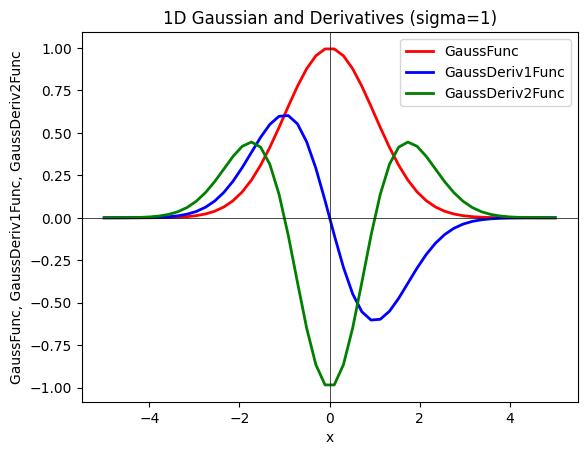

In [ ]:
# Con la siguiente figura verificamos que las funciones Gaussianas implementadas son correctas
plt.figure()
xvalues = np.linspace(-5, 5)
yvalues1 = GaussFunc(xvalues,1)
yvalues2 = GaussDeriv1Func(xvalues,1)
yvalues3 = GaussDeriv2Func(xvalues,1)
plt.plot(xvalues, yvalues1, lw=2, color='red',
label='GaussFunc')
plt.plot(xvalues, yvalues2, lw=2, color='blue',
label='GaussDeriv1Func')
plt.plot(xvalues, yvalues3, lw=2, color='green',
label='GaussDeriv2Func')
plt.title('1D Gaussian and Derivatives (sigma=1)')
plt.xlabel('x')
plt.ylabel('GaussFunc, GaussDeriv1Func, GaussDeriv2Func')
plt.axhline(0, lw=0.5, color='black')
plt.axvline(0, lw=0.5, color='black')
plt.legend();

FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA


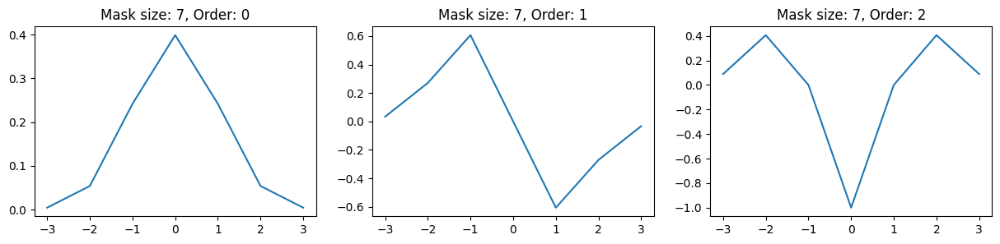

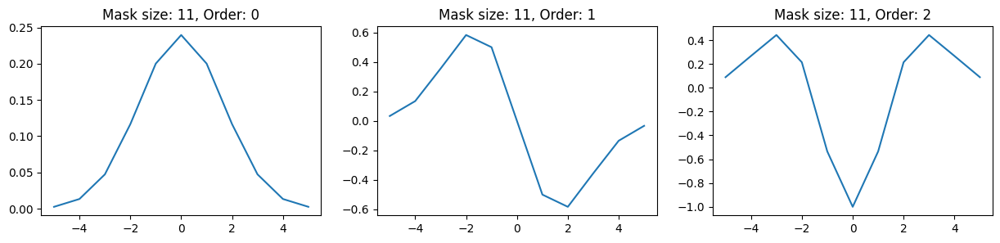

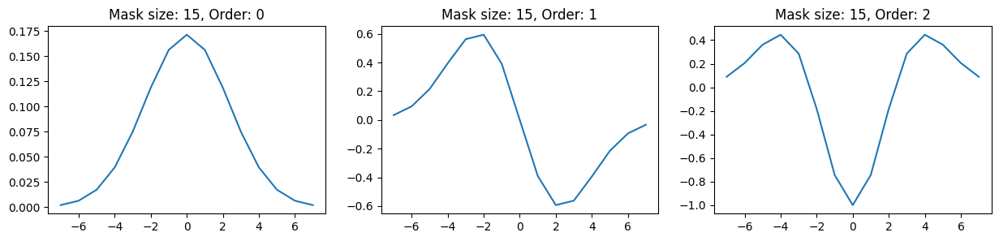

FIJAMOS AHORA EL SIGMA


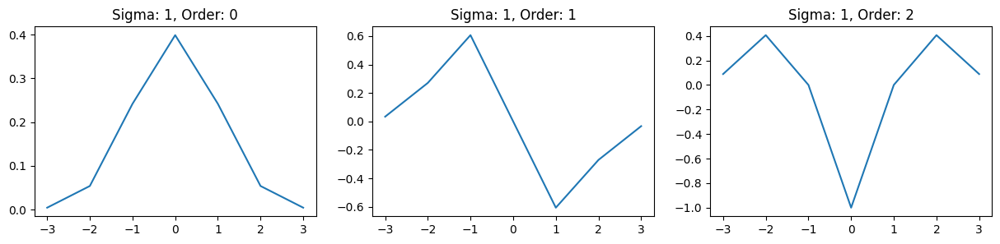

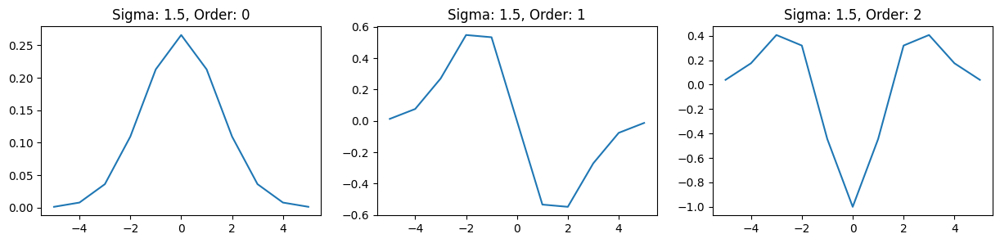

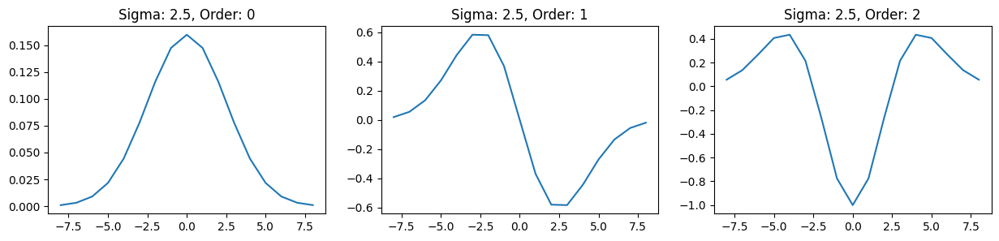

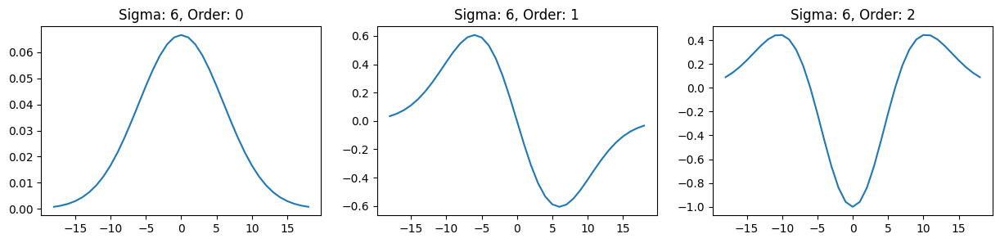

In [ ]:
# Definimos los sigmas y tamaños de mascara a usar
sigma_values = [1, 1.5, 2.5, 6]
size_masks = [7, 11, 15]

plt.rcParams["figure.figsize"] = (15, 3)  # Ajustamos la figura de la representación gráfica

# Fijamos el tamaño de mascara y hacemos que el sigma se calcule
print('FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA')
for sizeMask in size_masks:
    plt.figure()
    for i in range(3):  # Iteramos sobre los ordenes
        mask, sigma, sizeMask = gaussianMask1D(sizeMask=sizeMask, order=i)
        plt.subplot(1, 3, i + 1)
        plt.plot(np.linspace(-(sizeMask // 2), sizeMask // 2, sizeMask), mask)
        plt.title(f'Mask size: {sizeMask}, Order: {i}')
    plt.show()

# Fijamos sigma y calculamos el tamaño de mascara
print('FIJAMOS AHORA EL SIGMA')
for sigma in sigma_values:
    plt.figure()
    for i in range(3):  # Iteramos sobre los ordenes
        mask, sigma, sizeMask = gaussianMask1D(sigma=sigma, order=i)
        plt.subplot(1, 3, i + 1)
        plt.plot(np.linspace(-(sizeMask // 2), sizeMask // 2, sizeMask), mask)
        plt.title(f'Sigma: {sigma}, Order: {i}')
    plt.show()


#Análisis de las máscaras gaussianas y sus derivadas

##Máscara Gaussiana (Orden 0):

La máscara Gaussiana 1D en orden 0 tiene una forma de campana simétrica, cuyo pico central disminuye en amplitud y se ensancha conforme sigma aumenta.
Al fijar el tamaño de la máscara, el sigma se ajusta para que la Gaussiana ocupe adecuadamente ese tamaño. La función Gaussiana debería distribuirse uniformemente por la máscara.
Al fijar sigma, el tamaño de la máscara cambia para acomodar el ancho de la Gaussiana (relacionado con 3 veces el valor de sigma).
Esto es esperable: a medida que sigma crece, la Gaussiana se vuelve más amplia y sus valores disminuyen en el centro, reflejando una función de dispersión mayor. Como consecuencia el resultado visible es una mayor suavidad en la curva de la gaussiana

##Primera derivada de la Gaussiana (Orden 1):

La primera derivada de la función Gaussiana tiene una forma anti-simétrica (cambio de signo), pasando de valores positivos a negativos alrededor del centro.
El ancho y amplitud de los picos de la derivada dependen de sigma: cuanto mayor es sigma, mayor es el rango de cambio y menor es la pendiente de la transición. Esto se ajusta al hecho de que una Gaussiana más ancha implica una transición más suave.
##Segunda derivada de la Gaussiana (Orden 2):

La segunda derivada tiene una forma simétrica pero con un valor negativo central rodeado de dos valores positivos (una forma de "campana invertida" o "onda").
Esto corresponde a la segunda derivada de una función de "pico", donde el cambio más brusco ocurre en el centro, de positivo a negativo.
Nuevamente, a medida que sigma aumenta, los picos de la segunda derivada son menos pronunciados y abarcan un área mayor. Esto corresponde a una Gaussiana más amplia y una variación más lenta en sus alrededores.

## B) (1.5 puntos)

En este apartado se debe leer una imagen en escala de grises (`'zebra.jpg'`) y esta debe ser filtrada mostrando el resultado de la convolución con una Gaussiana, con la primera derivada de la Gaussiana (tanto en $X$ como en $Y$), y con la segunda derivada de la Gaussiana (tanto en $X$ como en $Y$). Para ello, hay que:
1. emplear los siguientes sigmas ($\{0.75,1,2,4,8, 16\}$),
2. usar la función de OpenCV `sepFilter2D()` con las máscaras calculadas a partir de las funciones desarrolladas en el apartado anterior,
3. mostrar todas las imágenes dentro del mismo canvas, tal y como se muestra más abajo,
4. analizar los resultados obtenidos y discutir si se corresponden con lo se esperaría obtener en base a nuestro conocimiento de la teoría.




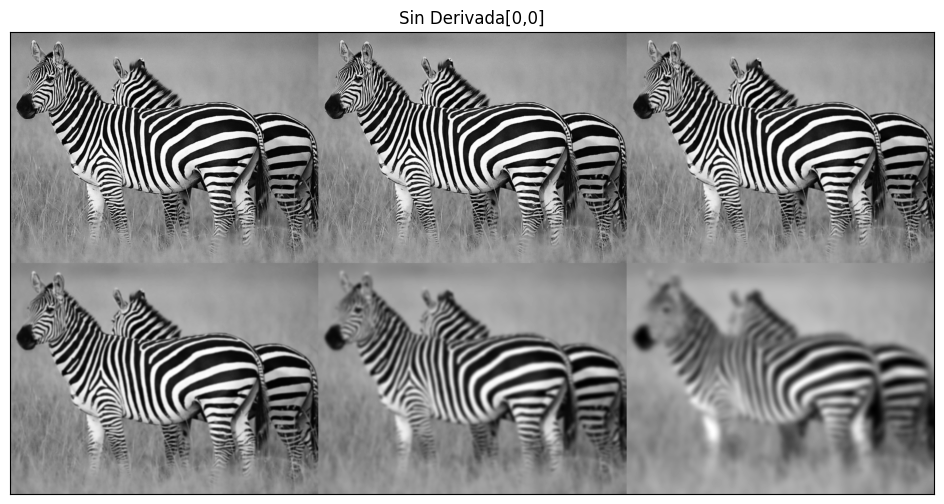

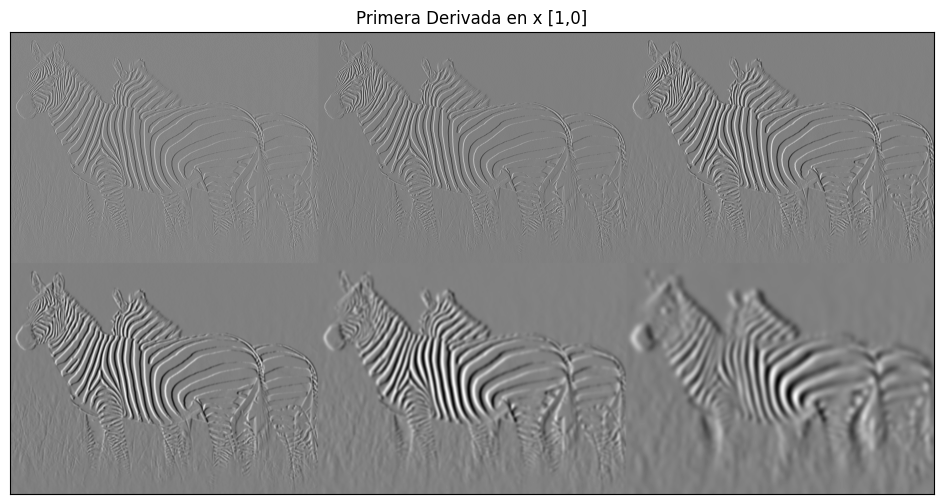

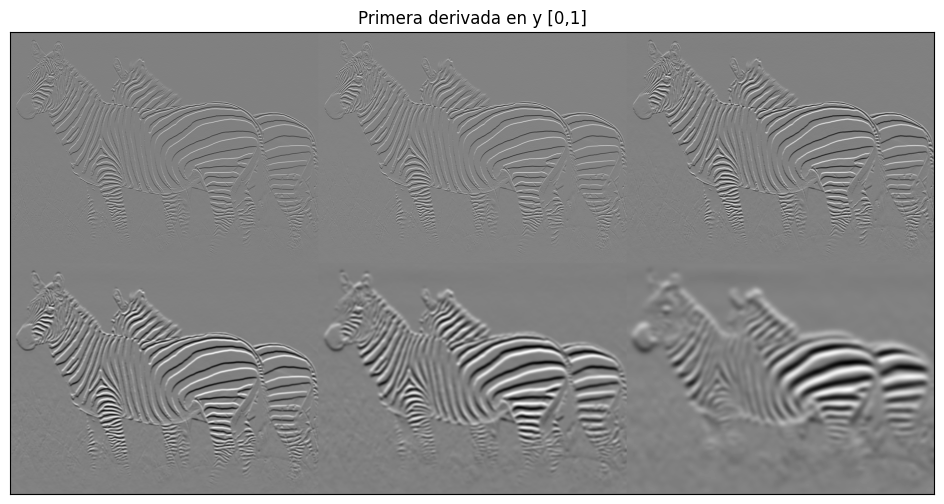

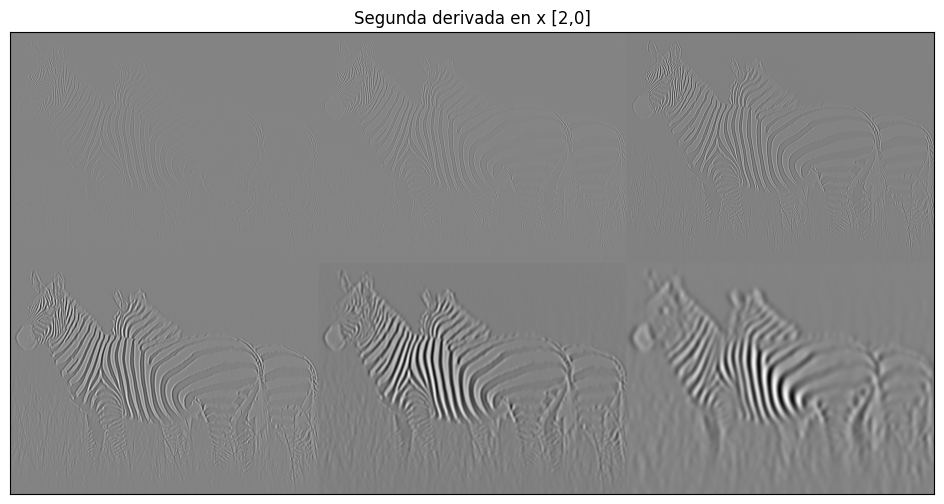

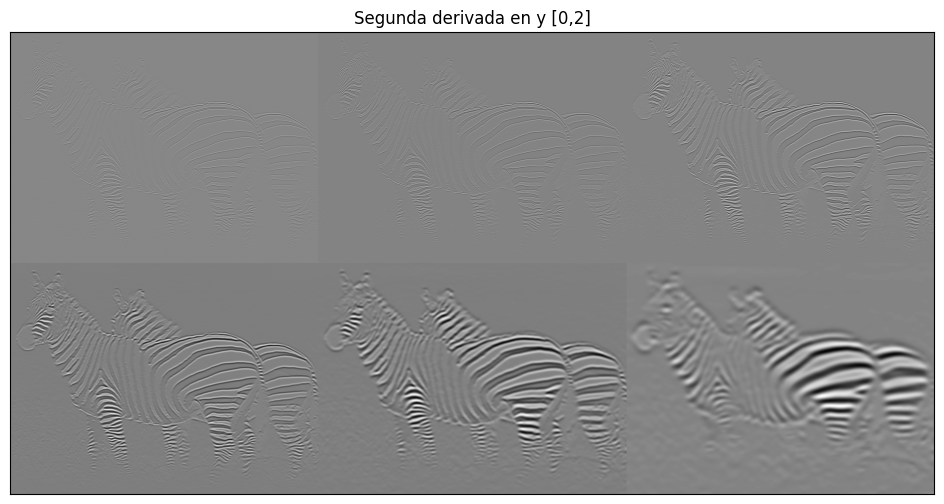

In [ ]:
import cv2
import numpy as np

# Función de convolución 2D con máscaras Gaussianas y sus derivadas

def my2DConv(im, sigma, orders):
    # Generamos las máscaras gaussianas 1D
    gauss_mask, _, _ = gaussianMask1D(sigma, order=0)
    deriv1_mask, _, _ = gaussianMask1D(sigma, order=1)
    deriv2_mask, _, _ = gaussianMask1D(sigma, order=2)

    # Suavizado Gaussiano
    if orders == [0, 0]:
        return cv2.sepFilter2D(im, cv2.CV_64F, gauss_mask, gauss_mask)

    # Derivada de primer orden
    elif orders == [1, 0]:
        return cv2.sepFilter2D(im, cv2.CV_64F, deriv1_mask, gauss_mask)  # Derivada en X
    elif orders == [0, 1]:
        return cv2.sepFilter2D(im, cv2.CV_64F, gauss_mask, deriv1_mask)  # Derivada en Y

    # Derivada de segundo orden
    elif orders == [2, 0]:
        return cv2.sepFilter2D(im, cv2.CV_64F, deriv2_mask, gauss_mask)  # Derivada en X
    elif orders == [0, 2]:
        return cv2.sepFilter2D(im, cv2.CV_64F, gauss_mask, deriv2_mask)  # Derivada en Y

    else:
        print('error in order of derivative')
        return None

# Sigmas a emplear
sigmas = [0.75, 1, 2, 4, 8, 16]

# Cargar imagen en escala de grises
im = cv2.imread('zebra.jpg', 0)

# Suavizado Gaussiano (orders = [0, 0])
vim0 = []
orders = [0, 0]
for sigma in sigmas:
    result = my2DConv(im, sigma, orders)
    vim0.append(rangeDisplay01(result,True))
displayMI_ES(vim0, 'Sin Derivada[0,0]', 2)

# Derivada de primer orden en X (orders = [1, 0])
vim1 = []
orders = [1, 0]
for sigma in sigmas:
    result = my2DConv(im, sigma, orders)
    vim1.append(rangeDisplay01(result,True))
displayMI_ES(vim1, 'Primera Derivada en x [1,0]', 2)

# Derivada de primer orden en Y (orders = [0, 1])
vim2 = []
orders = [0, 1]
for sigma in sigmas:
    result = my2DConv(im, sigma, orders)
    vim2.append(rangeDisplay01(result,True))
displayMI_ES(vim2, 'Primera derivada en y [0,1]', 2)

# Derivada de segundo orden en X (orders = [2, 0])
vim3 = []
orders = [2, 0]
for sigma in sigmas:
    result = my2DConv(im, sigma, orders)
    vim3.append(rangeDisplay01(result,True))
displayMI_ES(vim3, 'Segunda derivada en x [2,0]', 2)

# Derivada de segundo orden en Y (orders = [0, 2])
vim4 = []
orders = [0, 2]
for sigma in sigmas:
    result = my2DConv(im, sigma, orders)
    vim4.append(rangeDisplay01(result,True))
displayMI_ES(vim4, 'Segunda derivada en y [0,2]', 2)


#ANALISIS DE LOS RESULTADOS

##Suavizado Gaussiano (Zero Derivative [0, 0]):

El filtro Gaussiano suaviza la imagen al reducir el ruido y los detalles finos. Conforme aumenta el valor de sigma, el desenfoque es mayor, haciendo que la imagen pierda nitidez progresivamente, lo cual es coherente con la teoría: una Gaussiana más ancha representa un mayor radio de influencia, difuminando los detalles.

##Derivada de primer orden (Primeras Derivadas [1, 0] y [0, 1]):

Estas imágenes muestran bordes en la dirección correspondiente: [1, 0] resalta bordes verticales, y [0, 1] resalta bordes horizontales.
Con valores bajos de sigma, los bordes se ven nítidos; al aumentar sigma, los bordes se vuelven más difusos, abarcando áreas mayores y mostrando menos detalles finos. Esto coincide con la teoría, ya que una derivada Gaussiana de primer orden destaca los cambios de intensidad y se comporta como un detector de bordes.

##Derivada de segundo orden (Segundas Derivadas [2, 0] y [0, 2]):

Estas derivadas resaltan regiones de cambio de intensidad aún más fuertes, revelando contornos internos y texturas más profundas de la imagen.
Conforme el sigma aumenta, los detalles finos se suavizan, y se observan zonas de transición en lugar de líneas nítidas. Los filtros de segunda derivada ayudan a detectar cambios de pendiente en las intensidades pero tienen como probleam la introdución de ruido en las zonas "planas".

## C) (1 punto)

En este apartado hay que emplear la función de OpenCV `sepFilter2D()` con $\sigma=2.0$ para calcular y mostrar el gradiente (4 imágenes: derivada en $X$, derivada en $Y$, magnitud y orientación) y la Laplaciana de la Gaussiana. Se debe explicar el trabajo realizado, incluyendo las expresiones matemáticas subyacentes y el análisis, al igual que en todos los ejercicios, relativo a si los resultados obtenidos se corresponden con lo esperado.

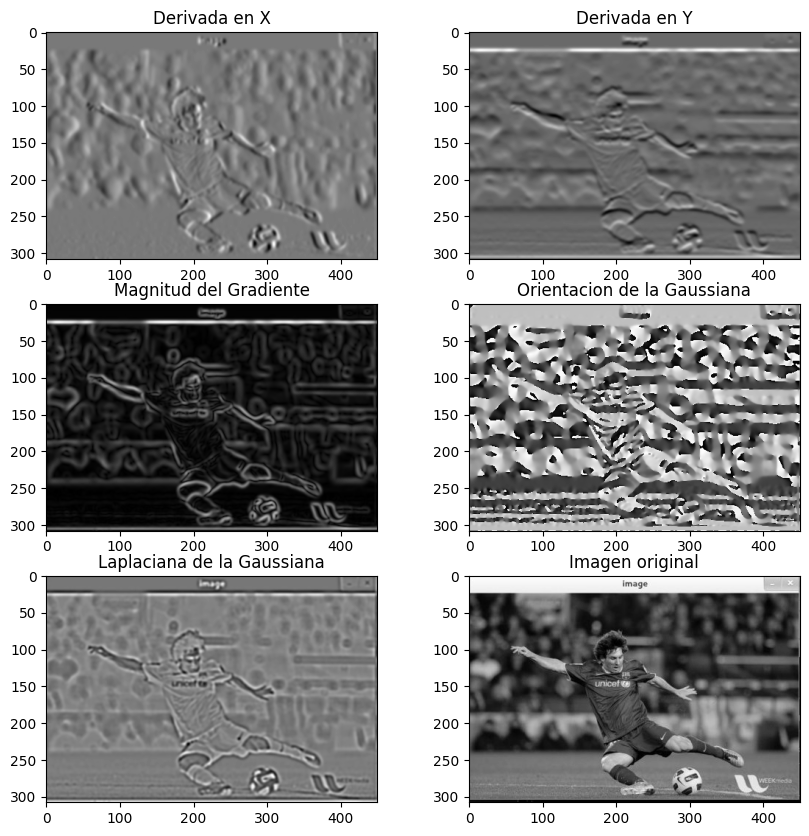

In [ ]:
def gradientIM(im, sigma):
    # Derivada en X
    dx = my2DConv(im, sigma, [1, 0])
    # Derivada en Y
    dy = my2DConv(im, sigma, [0, 1])

    # Magnitud del gradiente
    magnitude = np.sqrt(dx**2 + dy**2)

    # Orientación del gradiente
    orientation = np.arctan2(dy, dx)

    return dx, dy, magnitude, orientation

def laplacianG(im, sigma):
    # Derivada de segundo orden en X
    d2x = my2DConv(im, sigma, [2, 0])
    # Derivada de segundo orden en Y
    d2y = my2DConv(im, sigma, [0, 2])

    # Sumar las derivadas para obtener la Laplaciana
    laplacian = d2x + d2y

    return laplacian
# Cargar la imagen de Messi en escala de grises
im = cv2.imread('messi.jpg', 0)

# Parámetro sigma
sigma = 2.0

# Calcular el gradiente y la Laplaciana
dx, dy, magnitude, orientation = gradientIM(im, sigma)
laplacian = laplacianG(im, sigma)

# Mostrar las imágenes
plt.figure(figsize=(10, 10))

plt.subplot(3, 2, 1)
plt.title('Derivada en X')
plt.imshow(dx, cmap='gray')

plt.subplot(3, 2, 2)
plt.title('Derivada en Y')
plt.imshow(dy, cmap='gray')

plt.subplot(3, 2, 3)
plt.title('Magnitud del Gradiente')
plt.imshow(magnitude, cmap='gray')

plt.subplot(3, 2, 4)
plt.title('Orientacion de la Gaussiana')
plt.imshow(orientation, cmap='gray')

plt.subplot(3, 2, 5)
plt.title('Laplaciana de la Gaussiana')
plt.imshow(laplacian, cmap='gray')

plt.subplot(3, 2, 6)
plt.title('Imagen original')
plt.imshow(im, cmap='gray')

plt.show()



En este caso en lo relativo al proceso que hemos seguido, no existe una amplia explicación a dar, simplemente hemos aplicado las formulas del gradiente, magnitud y orientacion.

#Análisis de los Resultados
##Derivadas en X y Y:

Las imágenes correspondientes a las derivadas en
X y Y muestran los cambios de intensidad en cada dirección.
La derivada en X resalta bordes verticales, mientras que la derivada en
Y resalta bordes horizontales. Esta diferenciación es coherente con el comportamiento esperado de las derivadas parciales en imágenes.
##Magnitud del Gradiente:

La magnitud del gradiente combina las derivadas en X y Y para mostrar una imagen que destaca los bordes independientemente de su orientación.
Los bordes se ven con mayor intensidad donde hay cambios bruscos de intensidad en cualquier dirección. Este resultado coincide con la teoría de detección de bordes mediante la magnitud del gradiente, que identifica transiciones significativas de intensidad en la imagen.
Orientación del Gradiente:

La orientación del gradiente muestra las direcciones de los bordes, representadas en una escala de grises. La dirección indica el ángulo de cada borde en la imagen. Este resultado también concuerda con lo que hemos dado, la orientación del gradiente ayuda a describir el ángulo de los cambios de intensidad.

##Laplaciana de la Gaussiana:

La Laplaciana resalta las transiciones en la intensidad de la imagen. En la visualización, se observan zonas de cambio brusco en intensidad como bordes o contornos más fuertes, mientras que las áreas homogéneas tienden a aparecer más uniformes.
El comportamiento de la Laplaciana es acorde a su teoría, ya que la segunda derivada realza contornos y detalles de cambio rápido en la imagen, siendo útil para la detección de bordes secundarios y detalles más sutiles.

## D) (1.5 puntos)

Implemente una función para realizar "a mano" la convolución separable (es decir, empleando kernels 1D). Dicha función debe recibir como entrada una imagen (con el _padding_ adecuado, en caso de que lo necesite, ya incorporado) y un kernel 1D, y debe proporcionar como salida la imagen convolucionada con el kernel en ambas direcciones.

Una vez haya implementado la función, realice el suavizado de la imagen `motorcycle.bmp` (usando un _Gaussian kernel size_ de 7, y dejando que sea la propia función de creación del kernel la que determine el $\sigma$ adecuado), y compare el resultado con el de `cv2.GaussianBlur` (en donde se debe optar por la misma estrategia: fijando $ksize=7$ y dejando que sea la propia función de OpenCV la que escoja el sigma). ¿Hay diferencias (sea a nivel de resultado final o de tiempo de ejecución)? En caso afirmativo, ¿a qué se pueden deber?

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Función de convolución 1D corregida
def convolve1D(image, kernel):
    # Tamaños de la imagen y del kernel
    image_height, image_width = image.shape
    kernel_size = len(kernel)
    pad = kernel_size // 2

    # Inicializar la salida
    output = np.zeros_like(image, dtype=np.float64)

    # Aplicar padding reflejado para manejar los bordes
    padded_image = np.pad(image, ((0, 0), (pad, pad)), mode='reflect')

    # Convolución separable a lo largo de filas
    for i in range(image_height):
        for j in range(image_width):
            # Ventana en la fila con padding aplicado
            window = padded_image[i, j:j + kernel_size]
            # Convolución en una dimensión
            output[i, j] = np.sum(window * kernel)

    return output

# Función de convolución 2D usando convolución separable 1D
def convolve2D(image, kx, ky):
    # Aplicar primero la convolución en la dirección X (filas)
    temp_result = convolve1D(image, kx)
    # Transponer la imagen para aplicar la convolución en la dirección Y (columnas)
    temp_result = temp_result.T
    final_result = convolve1D(temp_result, ky)
    # Transponer nuevamente para devolver la imagen en la orientación original
    return final_result.T





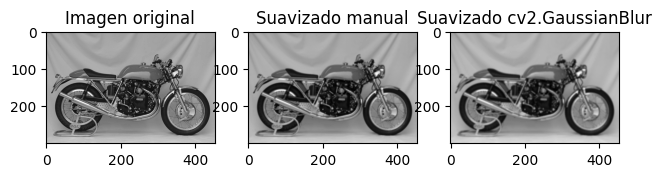

Tiempo de ejecución (manual): 2.05589 segundos
Tiempo de ejecución (cv2): 0.00605 segundos


In [ ]:
import time

# Cargar la imagen motorcycle.bmp en escala de grises
filename = 'motorcycle.bmp'
image = cv2.imread(filename, 0)

# Verificar que la imagen esté correctamente cargada
if image is None:
    raise ValueError(f"No se pudo cargar la imagen: {filename}")

# Parámetros
ksize = 7
sigma = (ksize - 1) / 6  # Para asegurarnos de que sea equivalente a la versión anterior

# Crear el kernel gaussiano 1D usando la nueva función
kernel, *_ = gaussianMask1D(sigma=sigma, sizeMask=ksize, order=0) # Extract only the kernel from the tuple.

# Aplicar convolución 2D "a mano" utilizando kernels 1D
start_time = time.time()
smoothed_manual = convolve2D(image, kernel, kernel)
manual_time = time.time() - start_time

# Aplicar suavizado Gaussiano usando OpenCV
start_time = time.time()
smoothed_cv2 = cv2.GaussianBlur(image, (ksize, ksize), 0)
cv2_time = time.time() - start_time

# Normalización de la imagen manual para comparación
smoothed_manual_normalized = np.uint8(smoothed_manual.clip(0, 255))

# Mostrar los resultados
plt.figure(figsize=(10, 5))

plt.subplot(1, 4, 1)
plt.title('Imagen original')
plt.imshow(image, cmap='gray')

plt.subplot(1, 4, 2)
plt.title('Suavizado manual')
plt.imshow(smoothed_manual_normalized, cmap='gray')

plt.subplot(1, 4, 3)
plt.title('Suavizado cv2.GaussianBlur')
plt.imshow(smoothed_cv2, cmap='gray')

plt.show()

print(f"Tiempo de ejecución (manual): {manual_time:.5f} segundos")
print(f"Tiempo de ejecución (cv2): {cv2_time:.5f} segundos")


#Implementación y Explicación de la Funciones usadas
##Función convolve1D:

Esta función realiza la convolución en una sola dirección, aprovechando el padding reflejado para evitar problemas en los bordes de la imagen.
La convolución se calcula multiplicando el kernel 1D por cada ventana de valores en la imagen, fila por fila. Esto permite realizar la operación en una dirección.

##Función convolve2D:

Aplica convolve1D en la dirección X para suavizar las filas.
Luego, se transpone la imagen y se aplica nuevamente convolve1D (usando el kernel en la dirección Y) para suavizar las columnas.
El resultado se transpone de nuevo para devolver la imagen en su orientación original.

#Análisis de Resultados y Comparación de Tiempos
##Calidad de Imagen:

Ambas imágenes suavizadas, tanto con la convolución manual como con OpenCV, muestran resultados muy similares visualmente, ya que ambos procesos aplican el mismo tipo de filtro Gaussiano.
La minima diferencai que existe ente los pixeles se debe a pequeñas variaciones en el cálculo interno de OpenCV y el manejo de precisión flotante.

##Tiempo de Ejecución:

En los resultados de ejecución, se observa que OpenCV es significativamente más rápido. Este rendimiento se debe a que OpenCV está optimizado para realizar convoluciones utilizando técnicas avanzadas, como la convolución con transformadas de Fourier y el aprovechamiento de la memoria caché y paralelización.
El tiempo del método manual es más elevado porque realiza la convolución mediante operaciones secuenciales y, además, la implementación en Python no está optimizada en bajo nivel.

## E) (0.5 puntos)

Las herramientas de IA generativa son de gran utilidad tanto para estudiantes como para docentes. No obstante, resulta fundamental tener una actitud crítica y asumir desde el principio que las respuestas proporcionadas por estas herramientas pueden ser factualmente incorrectas (véase,  por ejemplo, https://elpais.com/tecnologia/2024-09-25/los-nuevos-modelos-de-ia-como-chatgpt-persiguen-la-superinteligencia-pero-no-logran-ser-fiables-ni-en-preguntas-bobas.html). En este sentido, vale la pena recordar lo que indica la guía de la UGR (https://ceprud.ugr.es/formacion-tic/inteligencia-artificial): _"Debes revisar siempre la salida que genera y las posibles referencias que utilice. [...] Mejora tus resultados con la IAGen aprendiendo a usarla y a comunicarte con ella de manera adecuada. Pero no dejes que piense por ti."_

En este apartado trabajaremos de forma crítica la utilidad de estas herramientas. Para ello, el alumnado debe emplear ChatGPT (https://chatgpt.com/) para consultar _"en qué consiste y para qué sirve la normalización de escala, así como por qué, en dicha normalización de escala, se multiplica por $\sigma^n$, siendo $n$ el orden de derivada"_. No se trata meramente de copiar lo que indique ChatGPT como salida, sino de analizar y matizar su respuesta, confrontándola con otras lecturas y lo que el estudiante sabe de la teoría, indicando en qué aspectos dicha respuesta puede considerarse correcta y en qué aspectos quizás no lo es.

#TEXTO CHATGPT

Normalización de escala
La normalización de escala es un proceso que se utiliza en el procesamiento de imágenes para asegurar que los resultados de una operación de derivada (gradientes, bordes, etc.) sean invariantes a la escala. Esto significa que el comportamiento de las derivadas en diferentes escalas o tamaños de las estructuras en la imagen sea comparable y consistente, independientemente del nivel de detalle.

En las imágenes, los objetos pueden aparecer a diferentes tamaños (escalas) dependiendo de su distancia al observador o el enfoque de la cámara. Por lo tanto, al analizar una imagen, es importante poder detectar características como bordes o texturas de manera robusta, sin que dependan del tamaño o la escala a la que se encuentran.

La normalización de escala asegura que las respuestas de las operaciones derivativas (primera derivada, segunda derivada, etc.) sean comparablemente fuertes para estructuras similares en distintas escalas. En otras palabras, permite que detectemos los mismos bordes u otras características en una imagen, sin importar el tamaño de los objetos.

Multiplicación por
𝜎
𝑛
σ
n

En la normalización de escala,
𝜎
σ es el parámetro que representa la desviación estándar del kernel gaussiano utilizado para suavizar la imagen. Este parámetro controla el grado de suavizado y, por lo tanto, la "escala" a la que estamos analizando las estructuras de la imagen.

Cuando hablamos de la derivada de una función, como los bordes en una imagen, el orden de derivada
𝑛
n indica cuántas veces derivamos la función:

𝑛
=
1
n=1 para la primera derivada (gradiente),
𝑛
=
2
n=2 para la segunda derivada (laplaciano),
Y así sucesivamente.
El hecho de multiplicar por
𝜎
𝑛
σ
n
  al normalizar está relacionado con cómo varían las amplitudes de las derivadas en distintas escalas. En otras palabras, las derivadas tienden a hacerse más pequeñas a medida que aumenta el nivel de suavizado (mayor
𝜎
σ), por lo que necesitamos multiplicarlas por un factor que compense esta disminución.

Justificación de la multiplicación por
𝜎
𝑛
σ
n
 :
Derivadas y suavizado gaussiano: La operación de derivada en una imagen, cuando está precedida por un suavizado gaussiano (como en la detección de bordes), depende del valor de
𝜎
σ. A medida que aumentamos
𝜎
σ, la función gaussiana se suaviza más, y los bordes (o los cambios de intensidad) se hacen menos pronunciados. Sin la normalización, la respuesta de las derivadas sería más débil en escalas grandes.

Invariancia a la escala: Al multiplicar la derivada de orden
𝑛
n por
𝜎
𝑛
σ
n
 , corregimos la disminución en la magnitud de las derivadas. Esto permite que las características de la imagen, como los bordes, sean igualmente detectables en todas las escalas, asegurando que un borde fuerte en una imagen grande tenga una magnitud comparable a un borde fuerte en una imagen pequeña.

Compensación de la suavidad: A mayor
𝜎
σ, el suavizado es más fuerte, lo que reduce los detalles en la imagen. Al multiplicar por
𝜎
𝑛
σ
n
 , estamos ajustando la magnitud de las derivadas para que reflejen la "fuerza" del cambio de intensidad a diferentes escalas. Esto es particularmente importante cuando se realizan múltiples derivadas para detectar características en diferentes escalas.

Ejemplo de normalización de escala en la práctica:
Si estamos detectando bordes usando una primera derivada, la respuesta sin normalización sería mayor para escalas pequeñas (donde los detalles son más pronunciados) y menor para escalas grandes (donde los detalles se han suavizado). La normalización asegura que un borde detectado a una escala pequeña tenga la misma relevancia que un borde detectado a una escala mayor, permitiendo una detección robusta y comparable en diferentes niveles de escala.

Por lo tanto, la multiplicación por
𝜎
𝑛
σ
n
  en cada derivada normaliza la respuesta y garantiza que las derivadas sean invariantes a la escala, permitiendo que las características relevantes sean detectadas de manera robusta en toda la imagen sin importar su tamaño o resolución.

Resumen:
La normalización de escala es crucial para obtener resultados invariantes a la escala al aplicar derivadas o detección de bordes en una imagen.
La multiplicación por
𝜎
𝑛
σ
n
  asegura que las derivadas de orden
𝑛
n mantengan su magnitud relativa a través de diferentes escalas, lo que garantiza la detección consistente de características como bordes en toda la imagen, sin importar el nivel de detalle.
Este proceso es fundamental en tareas como la detección de características en imágenes y en la creación de descriptores que sean robustos frente a cambios en la escala de los objetos.


#MI RESPUESTA

Una vez leido lo que dice ChatGPT sobre la normalización de escala me parece coherente lo que describe y en general una buena explicación. Sin embargo podría como pega que por obvios motivos falta la habilidad "humana" de poner ejemplos de alta abstracción que una persona si puede comprender pero una máquina no. En clase de prácticas se nos explicó la normalización de escala utilizando de ejemplo el cordón de una zapatilla. Según el ejemplo cuánto mas estiramos el cordón desde los lados, si bien este mantiene su forma, la escala de estas formas se disminuye lo cual supone una pérdida de información en la " pendiente del cordon".
En nuestro caso ChatGPT no es capaz de dar una explicación de calidad similar porque no puede ver la correlación entre cordones de zapatillas y la escala de una gaussiana. Con todo esto dicho considero que chatGPT es una gran herramienta que tiene mucho uso en el desarrollo de tareas triviales y monotonas.

# **Ejercicio 2**:  Pirámides Gaussianas y Laplacianas (3.5 puntos)







## A) (1.5 puntos)

Construya una pirámide Gaussiana de 4 niveles empleando máscaras Gaussianas de tamaño $7\times7$. No se permite emplear las funciones `pyrUp()` y `pyrDown()` de OpenCV, ni tampoco `cv2.resize()`.

In [ ]:
'''
This function displays a pyramid of images, providing as input the list of images to display.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1, cv2.resize(im1,(im1.shape[0]//2,im1.shape[1]//2),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//4,im1.shape[1]//4),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//8,im1.shape[1]//8),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//16,im1.shape[1]//16),cv2.INTER_LINEAR)]

displayPyramid(images, title='Piramide de Manzanas')

'''
def displayPyramid(vim, title='result'):
  temp = np.zeros_like(vim[0])
  if np.mod(temp.shape[1],2)==0:
    h = temp[:, :temp.shape[1]//2]
  else:
    h = temp[:, :(temp.shape[1]//2)+1]
  out = np.hstack((temp, h))
  top = 0
  out[0:vim[0].shape[0], 0:vim[0].shape[1]] = vim[0]
  left = vim[0].shape[1]
  for i in range(1, len(vim)):
    out[top:top+vim[i].shape[0], left:left + vim[i].shape[1]] = vim[i]
    top += vim[i].shape[0]
  displayIm(out, title)

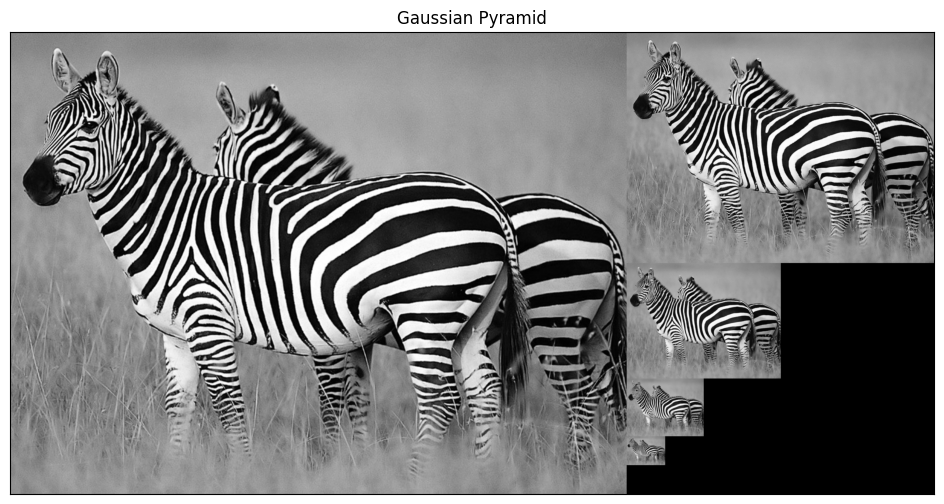

In [ ]:
def pyramidGauss(im, sizeMask=7, nlevel=4):
    # Generar la máscara Gaussiana en 1D
    kx, _, _ = gaussianMask1D(sizeMask=sizeMask, order=0)

    ky = kx.copy()  # Usar la misma máscara en ambas direcciones

    # Lista para almacenar los niveles de la pirámide
    pyramid = [im]
    #El proceso a seguir es repetir smoothing y subsampling
    for level in range(1, nlevel + 1):
        # Suavizar la imagen usando convolución separable en 2D
        blurred = convolve2D(pyramid[-1], kx, ky)

        # Subsampling: tomar un pixel de cada dos en cada dirección
        subsampled = blurred[::2, ::2]

        # Añadir el nivel actual a la pirámide
        pyramid.append(subsampled)

    return pyramid

# Cargar la imagen
im = cv2.imread('zebra.jpg', 0).astype(np.float64)

# Generar la pirámide gaussiana
pyrG = pyramidGauss(im, sizeMask=7, nlevel=4)

# Mostrar la pirámide
displayPyramid(pyrG, 'Gaussian Pyramid')


## B) (1 punto)

# Use su código del apartado anterior para implementar una función que permita construir una pirámide Laplaciana de 4 niveles.

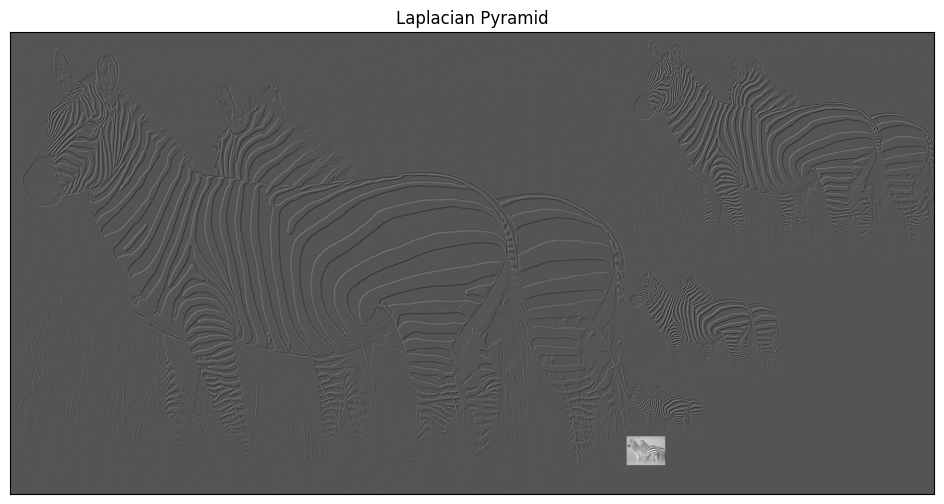

In [ ]:
def pyramidLap(im, sizeMask = 7, nlevel=4, flagInterp=cv2.INTER_LINEAR):
    # Crear la pirámide gaussiana
    pyrG = pyramidGauss(im, sizeMask=sizeMask, nlevel=nlevel)

    # Lista para almacenar la pirámide laplaciana
    pyramidLap = []

    for i in range(nlevel):
        # Suavizar y reducir la imagen actual en la pirámide gaussiana
        gauss_level = pyrG[i]
        gauss_level2 = pyrG[i + 1]

        # Expandir la imagen subsampleada del siguiente nivel de la pirámide
        expanded = cv2.resize(gauss_level2, (gauss_level.shape[1], gauss_level.shape[0]), interpolation=flagInterp)
        # Calcular la diferencia entre el nivel actual y la imagen expandida
        laplacian = gauss_level - expanded

        # Añadir el nivel de la pirámide laplaciana
        pyramidLap.append(laplacian)

    # Añadir el último nivel de la pirámide gaussiana (más pequeño) tal cual
    pyramidLap.append(pyrG[-1])

    return pyramidLap

# Cargar la imagen
im = cv2.imread('zebra.jpg', 0).astype(np.float64)

# Generar la pirámide laplaciana
pyrL = pyramidLap(im, sizeMask=7, nlevel=4)

# Mostrar la pirámide laplaciana
displayPyramid(pyrL, 'Laplacian Pyramid')


## C) (0.5 puntos)

*Ahora* realice la misma operación que en los apartados anteriores, pero sin suavizar antes de hacer subsampling a la hora de crear la pirámide Gaussiana. ¿Hay diferencias visuales en la pirámide Laplaciana generada? ¿A qué se pueden deber estas?

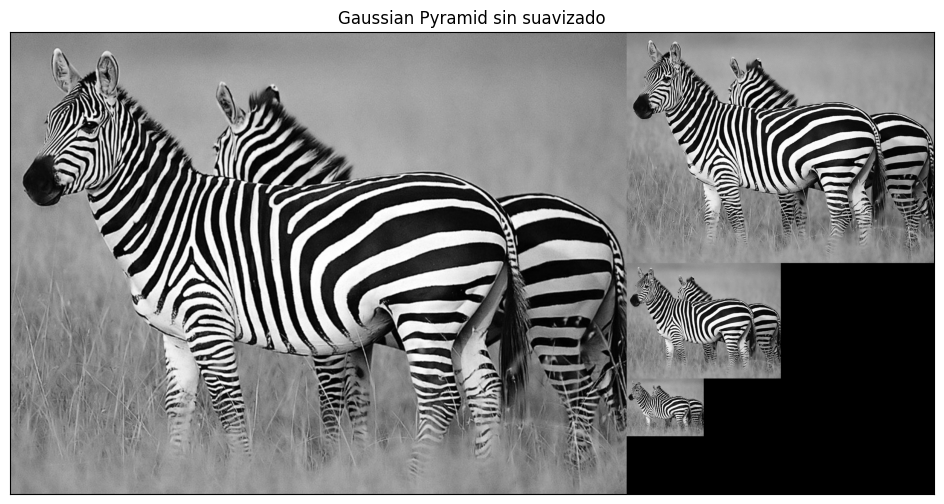

In [ ]:
import cv2
import numpy as np

# Pirámide gaussiana sin suavizado
def pyramidGaussNoSmooth(im, nlevel=4):
    gauss_pyramid = [im]  # La imagen original es el primer nivel
    for i in range(1, nlevel):
        # Aquí eliminamos el paso de suavizado, solo hacemos subsampling
        reduced = gauss_pyramid[i-1][::2, ::2]  # Tomamos cada 2 píxeles
        gauss_pyramid.append(reduced)
    return gauss_pyramid

# Pirámide laplaciana sin suavizado
def pyramidLapNoSmooth(im, nlevel=4, flagInterp=cv2.INTER_LINEAR):
    # Crear la pirámide gaussiana sin suavizado
    pyrG = pyramidGaussNoSmooth(im, nlevel=nlevel)

    # Lista para almacenar la pirámide laplaciana
    pyramidLap = []

    for i in range(nlevel - 1):  # Ajuste aquí para evitar el último nivel
        # Suavizar y reducir la imagen actual en la pirámide gaussiana
        gauss_level = pyrG[i]

        # Expandir la imagen subsampleada del siguiente nivel de la pirámide
        expanded = cv2.resize(pyrG[i + 1], (gauss_level.shape[1], gauss_level.shape[0]), interpolation=flagInterp)

        # Calcular la diferencia entre el nivel actual y la imagen expandida
        laplacian = gauss_level - expanded

        # Añadir el nivel de la pirámide laplaciana
        pyramidLap.append(laplacian)

    # Añadir el último nivel de la pirámide gaussiana (el más pequeño) tal cual
    pyramidLap.append(pyrG[-1])

    return pyramidLap


  # Cargar la imagen
im = cv2.imread('zebra.jpg', 0).astype(np.float64)

# Generar la pirámide laplaciana
pyrGN = pyramidGaussNoSmooth(im, nlevel=4)

# Mostrar la pirámide laplaciana
displayPyramid(pyrGN, 'Gaussian Pyramid sin suavizado')


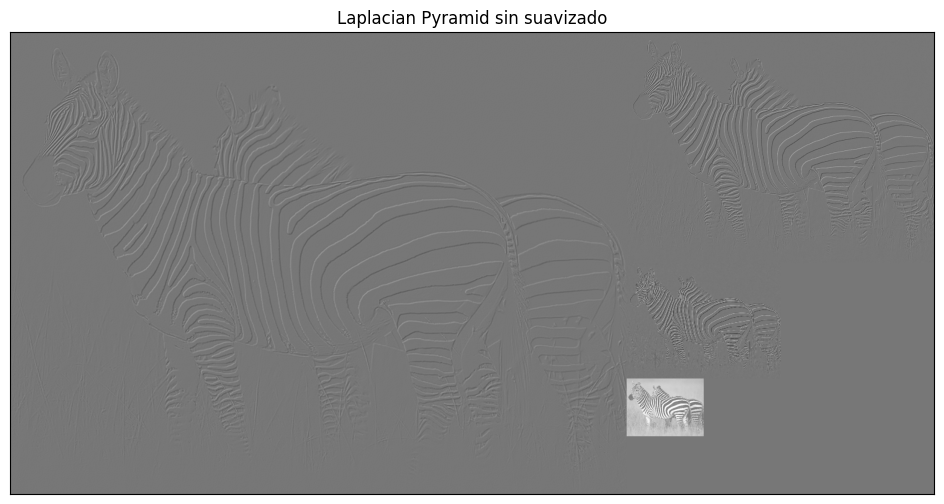

In [ ]:
  # Cargar la imagen
im = cv2.imread('zebra.jpg', 0).astype(np.float64)

# Generar la pirámide laplaciana
pyrLN = pyramidLapNoSmooth(im, nlevel=4)

# Mostrar la pirámide laplaciana
displayPyramid(pyrLN, 'Laplacian Pyramid sin suavizado')



#Consecuencias de omitir el Suavizado Gaussiano:

##Alias en el Submuestreo:

Como hemos visto en clase cuando se suaviza la gaussiana ocurre el fenomeno conocido como el aliasing ,que ocurre cuando los detalles de alta frecuencia se confunden con detalles de baja frecuencia en la imagen más pequeña. Esto introduce patrones artificiales o errores de textura en la pirámide Laplaciana.

##Inexactitud en la Información de Bordes:

Los bordes y detalles que deberían aparecer claramente en cada nivel Laplaciano quedan difusos o distorsionados, debido a la presencia de frecuencias más altas que no fueron eliminadas. Esto degrada la utilidad de la pirámide para aplicaciones como la detección de bordes o la reconstrucción de imágenes.

##Problemas en la Reconstrucción de Imágenes:

La reconstrucción de la imagen original a partir de la pirámide Laplaciana se ve comprometida. Dado que cada nivel no representa diferencias limpias entre frecuencias, la suma de las imágenes Laplacianas y el último nivel Gaussiano no reproducirá fielmente la imagen original.

## D) (0.5 puntos)

Implemente ahora una función para reconstruir la imagen codificada en la pirámide Laplaciana del apartado 2.B. Verifique que es posible obtener una copia exacta de la imagen original. Para ello, calcule el error de reconstrucción como el _Root Mean Squared Error_ (RMSE) entre los niveles de intensidad de la imagen original y la imagen reconstruida.

Error per pixel (con suavizado): 0.0
Error per pixel (sin suavizado): 6.769087408445196


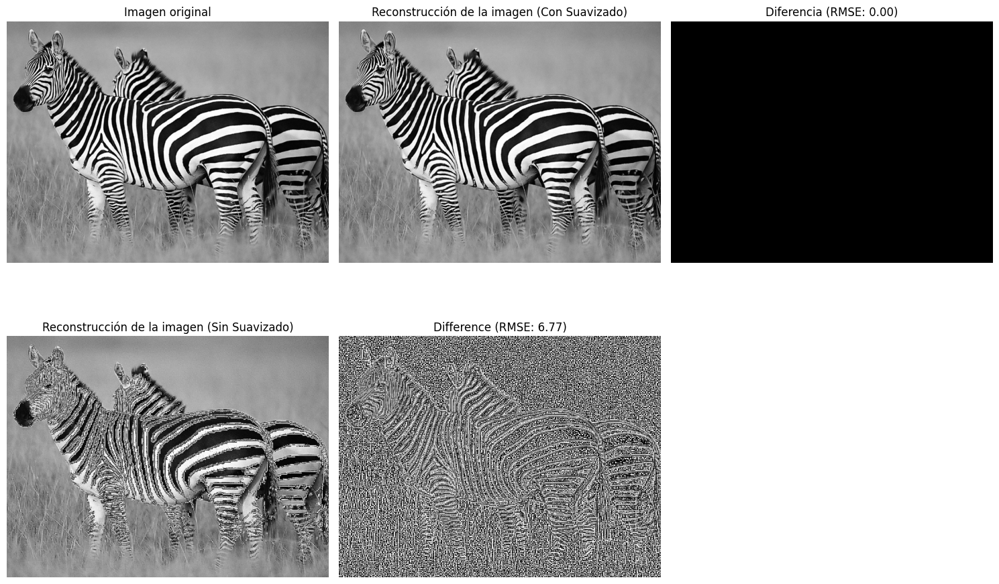

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Función de reconstrucción
def reconstructLap(pyramidLap, flagInterp=cv2.INTER_LINEAR):
    recons = pyramidLap[-1]
    for i in range(len(pyramidLap) - 2, -1, -1):
        expanded = cv2.resize(recons, (pyramidLap[i].shape[1], pyramidLap[i].shape[0]), interpolation=flagInterp)
        recons = expanded + pyramidLap[i]
    return recons



# Cargar la imagen original en escala de grises
im = cv2.imread('zebra.jpg', 0)

# Generamos las pirámides Laplacianas
laplacian_pyramid = pyramidLap(im, sizeMask=7, nlevel=4)
laplacian_pyramidN = pyramidLapNoSmooth(im, nlevel=4)

# Reconstruimos las imágenes desde las pirámides Laplacianas
recons = reconstructLap(laplacian_pyramid)
recons2 = reconstructLap(laplacian_pyramidN, flagInterp=cv2.INTER_NEAREST)

# Calculamos el error (RMSE)
rmse = np.sqrt(np.mean((im - np.round(recons)) ** 2))
rmse2 = np.sqrt(np.mean((im - np.round(recons2)) ** 2))

print(f'Error per pixel (con suavizado): {rmse}')
print(f'Error per pixel (sin suavizado): {rmse2}')

# Visualizamos la imagen original, las imágenes reconstruidas y sus diferencias
plt.figure(figsize=(15, 10))

# Imagen original
plt.subplot(2, 3, 1)
plt.imshow(im, cmap='gray')
plt.title('Imagen original')
plt.axis('off')

# Imagen reconstruida con suavizado
plt.subplot(2, 3, 2)
plt.imshow(np.round(recons), cmap='gray')
plt.title('Reconstrucción de la imagen (Con Suavizado)')
plt.axis('off')

# Diferencia con suavizado
plt.subplot(2, 3, 3)
plt.imshow(np.abs(im - np.round(recons)), cmap='gray')
plt.title(f'Diferencia (RMSE: {rmse:.2f})')
plt.axis('off')

# Imagen reconstruida sin suavizado
plt.subplot(2, 3, 4)
plt.imshow(np.round(recons2), cmap='gray')
plt.title('Reconstrucción de la imagen (Sin Suavizado)')
plt.axis('off')

# Diferencia sin suavizado
plt.subplot(2, 3, 5)
plt.imshow(np.abs(im - np.round(recons2)), cmap='gray')
plt.title(f'Difference (RMSE: {rmse2:.2f})')
plt.axis('off')

# Mostrar el gráfico
plt.tight_layout()
plt.show()


Como podemos observar el resultado es exactamente y sin duda el esperado. Por un lado en la pirámide en la que utilizamos el suavizado gaussiano dentro de la piramide gaussiana, la reconstrucción ha sido perfecta y sin diferencias respecto a la original. Sin embargo al omitir el suavizado, se introdujeron frecuencias altas artificalmente, lo que modifico la imagen y a la hora de la reconstrucción el resultado es muy distinto de lo buscado.

# **Ejercicio 3: Imágenes Híbridas** (1.5 puntos)

Este ejercicio se basa en el siguiente trabajo: $\textit{Oliva, A., Torralba, A., & Schyns, P. G. (2006). Hybrid images. ACM Transactions on Graphics (TOG), 25(3), 527-532}$ (https://stanford.edu/class/ee367/reading/OlivaTorralb_Hybrid_Siggraph06.pdf). Vamos a aprender cómo el sistema visual humano extrae información sobre un objeto en función de la distancia. Para ello, construimos una imagen híbrida a partir de dos imágenes de objetos diferentes. Mezclando adecuadamente parte de las altas frecuencias de una imagen con parte de las bajas frecuencias de otra imagen, obtenemos una imagen híbrida que muestra diferentes percepciones con la distancia. El sigma empleado para filtrar ambas imágenes (tanto la de alta como la de bajas frecuencias) es el aspecto clave para seleccionar el rango de frecuencias altas y bajas de cada imagen. Cuanto mayor sea el valor sigma, mayor será la eliminación de altas frecuencias de la imagen. Se recomienda elegir este valor por separado para cada una de las imágenes y, de hecho, seguramente sea posible (y deseable) el tener distintos valores para distintos pares de imágenes.

Aspectos de importancia en relación a este ejercicio:

1. Como mínimo, se deben generar las imágenes híbridas correspondientes a `'cat.bmp'+'dog.bmp'`, `'submarine.bmp'+'fish.bmp'` y `'marilyn.bmp'+'einstein.bmp'` (todas ellas en escala de grises). Se debe emplear una pirámide Gaussiana con 5 niveles para mostrar el efecto obtenido.
2. No es necesario seguir al pie de la letra el artículo de referencia y operar en el dominio de la frecuencia (Fourier). Basta con operar en el dominio del espacio, como hemos hecho en todos los demás apartados de esta práctica.
3. Se debe explicar con claridad el criterio empleado para escoger la imagen de altas y la imagen de bajas frecuencias, así como el proceso seguido para filtrar la imagen de altas frecuencias y la de bajas frecuencias (incluyendo la elección de los sigmas finalmente utilizados; es decir, no sería suficiente indicar sucintamente que "se procedió por medio de prueba y error hasta obtener el sigma final").

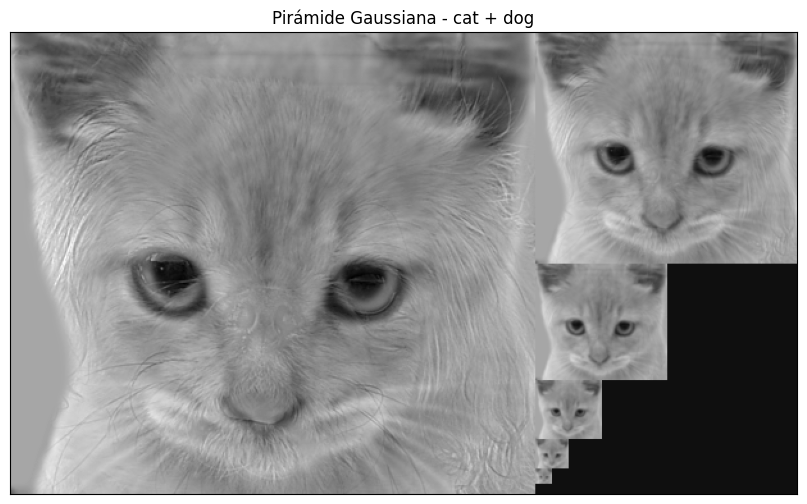

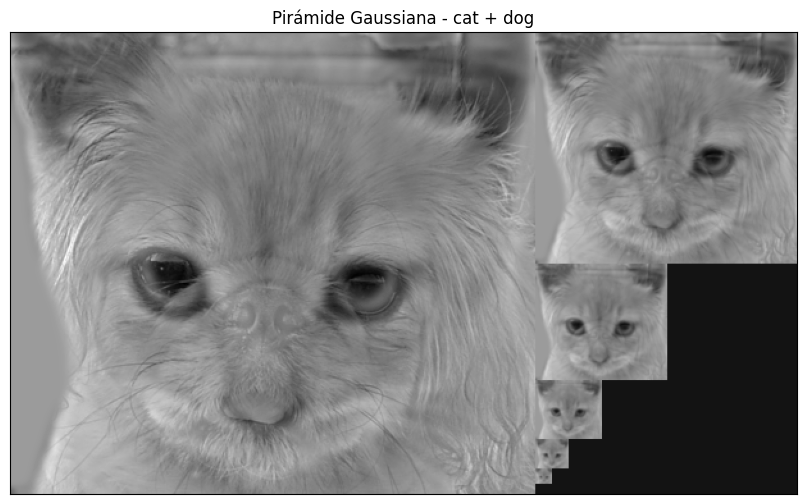

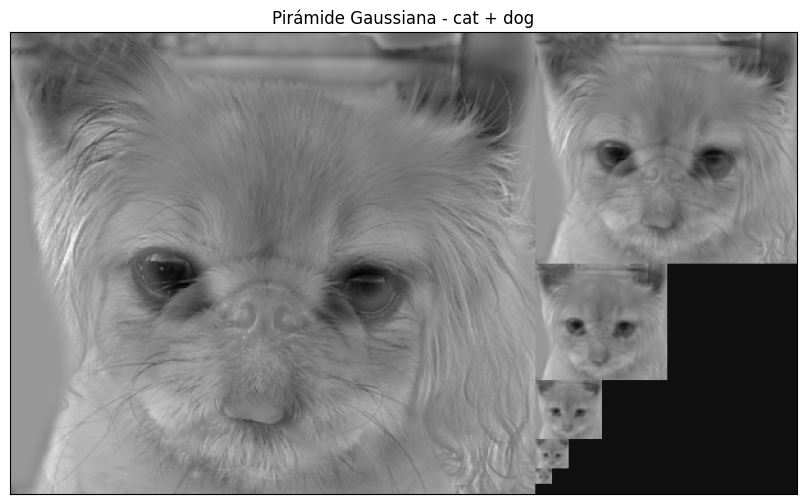

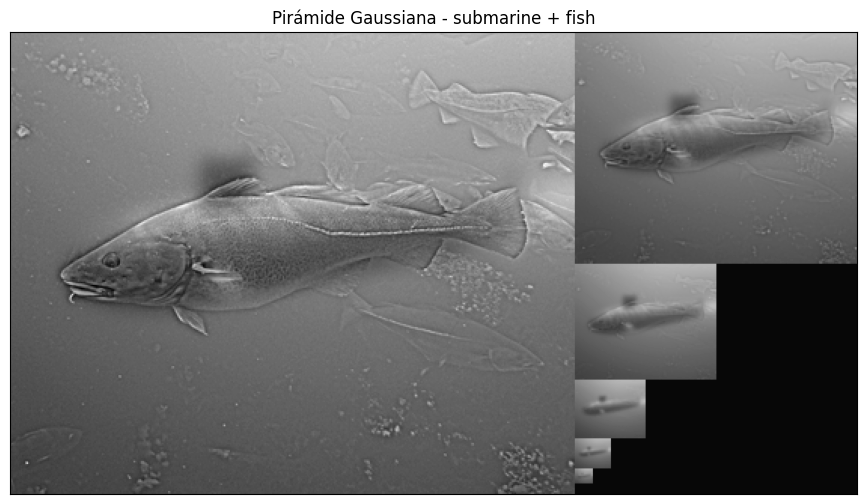

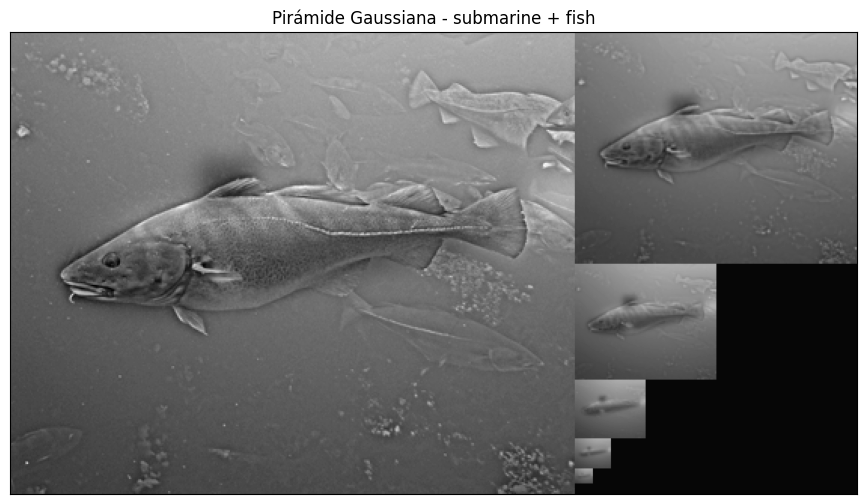

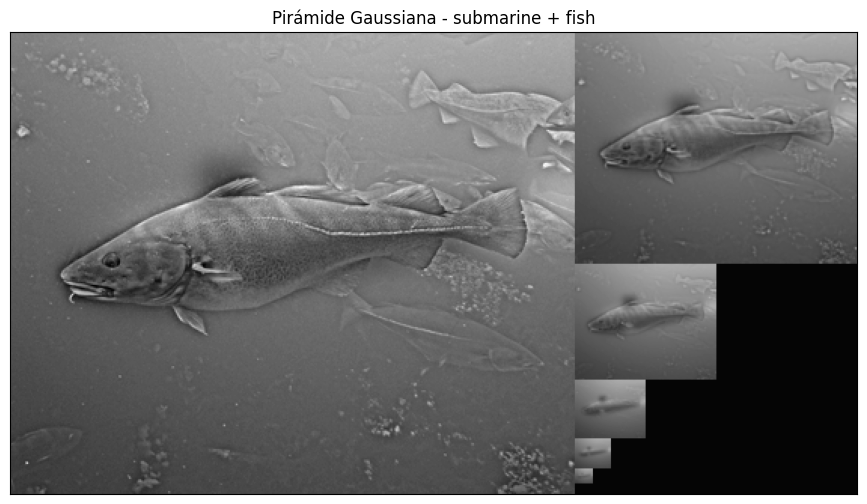

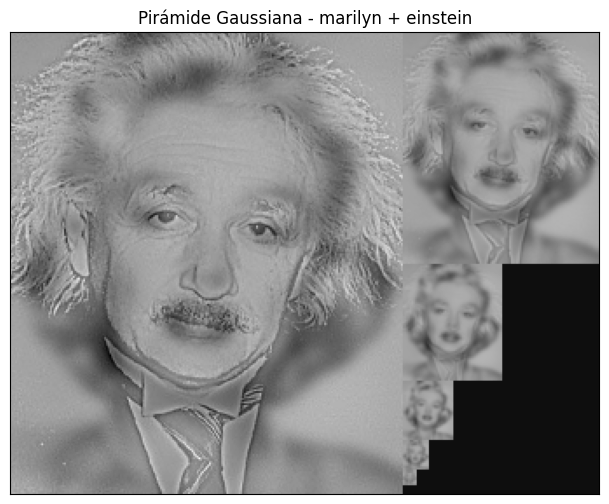

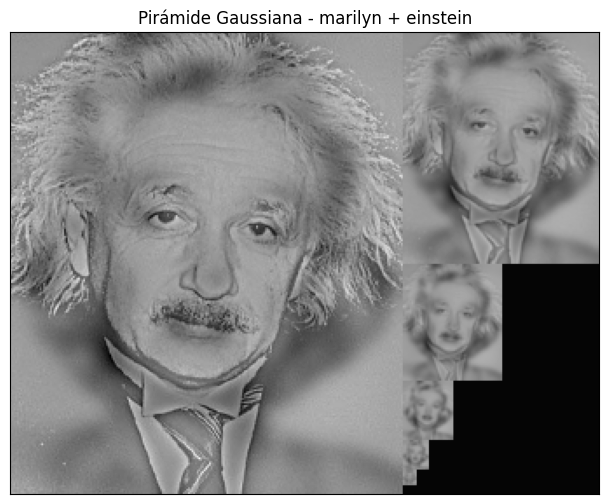

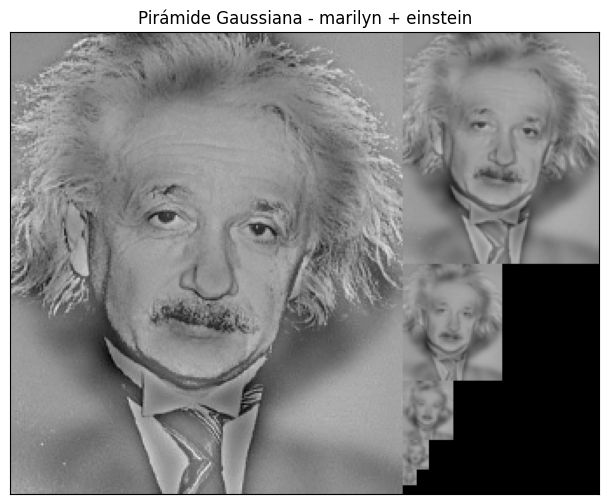

In [ ]:
def hybridImage(img1, img2, sigma_low, sigma_high):
    # Generar máscaras gaussianas para bajas frecuencias
    kx_low, _, _ = gaussianMask1D(sigma=sigma_low, order=0)
    ky_low = kx_low.copy()

    # Filtrar img1 para bajas frecuencias
    img1_low = convolve2D(img1, kx_low, ky_low)

    # Generar máscaras gaussianas para altas frecuencias
    kx_high, _, _ = gaussianMask1D(sigma=sigma_high, order=0)
    ky_high = kx_high.copy()

    # Filtrar img2 y restar para obtener las altas frecuencias
    img2_blurred = convolve2D(img2, kx_high, ky_high)
    img2_high = img2 - img2_blurred

    # Combinar las imágenes de bajas y altas frecuencias
    hybrid = img1_low + img2_high

    return hybrid

# Lista de pares de imágenes y parámetros de filtrado
image_pairs = [
    ('cat.bmp', 'dog.bmp', 2, 2),
    ('cat.bmp', 'dog.bmp', 3, 4),
    ('cat.bmp', 'dog.bmp', 5, 5),
    ('submarine.bmp', 'fish.bmp', 6, 2),
    ('submarine.bmp', 'fish.bmp', 7, 3),
    ('submarine.bmp', 'fish.bmp', 8, 3),
    ('marilyn.bmp', 'einstein.bmp', 4, 2),
    ('marilyn.bmp', 'einstein.bmp', 5, 3),
    ('marilyn.bmp', 'einstein.bmp', 6, 4)
]

# Procesar cada par de imágenes
for pair in image_pairs:
    img1_name, img2_name, sigma_low, sigma_high = pair

    # Cargar imágenes en escala de grises
    img1 = cv2.imread(img1_name, cv2.IMREAD_GRAYSCALE).astype(np.float64)
    img2 = cv2.imread(img2_name, cv2.IMREAD_GRAYSCALE).astype(np.float64)

    # Redimensionar las imágenes si no tienen el mismo tamaño
    if img1.shape != img2.shape:
        img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

    # Generar la imagen híbrida
    hybrid_img = hybridImage(img1, img2, sigma_low, sigma_high)

    # Generar la pirámide gaussiana
    hibrida_pyramid = pyramidGauss(hybrid_img, sizeMask=7, nlevel=5)

    # Mostrar la pirámide para cada par
    title = f'Pirámide Gaussiana - {img1_name.split(".")[0]} + {img2_name.split(".")[0]}'
    displayPyramid(hibrida_pyramid, title)




Para crear imágenes híbridas que resulten visualmente coherentes y logren el efecto de percepción a diferentes distancias, he seleccionado las imágenes de bajas y altas frecuencias en cada par de la siguiente manera:

##Gato y Perro (cat.bmp y dog.bmp)
Para este par, he optado por utilizar el contorno del gato (cat.bmp) como la capa de bajas frecuencias. Esto permite que la estructura general de la cara del gato sea claramente perceptible al observar la imagen híbrida desde lejos, ayudando a que los bordes suaves de su contorno predominen. Por otro lado, he asignado la imagen del perro (dog.bmp) como las altas frecuencias, lo que añade detalles finos, como la textura del pelaje y los rasgos del rostro del perro, que emergen al observar la imagen de cerca. De esta manera, la imagen híbrida aparece como el gato desde la distancia, pero permite ver al perro en detalle cuando se examina de cerca.

##Submarino y Pez (submarine.bmp y fish.bmp)
En este caso, he elegido el submarino (submarine.bmp) como la capa de bajas frecuencias. Así, su silueta y forma general quedan definidas en la imagen híbrida y son perceptibles al observarla desde lejos, proporcionando una estructura base. Por otro lado, he seleccionado el pez (fish.bmp) como las altas frecuencias, lo cual añade detalles sutiles de su superficie, como las escamas o las aletas, visibles de cerca en la imagen híbrida. Esto crea una ilusión en la que, de lejos, la imagen se ve como un submarino, pero al acercarse se pueden percibir las características distintivas del pez.

##Marilyn y Einstein (marilyn.bmp y einstein.bmp)
Para este par, he utilizado el retrato de Marilyn Monroe (marilyn.bmp) en las bajas frecuencias. Esto asegura que sus rasgos faciales suaves, reconocibles a nivel estructural, dominen la imagen híbrida cuando se observe desde lejos. Luego, he optado por el retrato de Einstein (einstein.bmp) como la capa de altas frecuencias. Esto permite que detalles más específicos, como sus arrugas y la textura de su piel, emerjan en la imagen al acercarse, fusionando de lejos el contorno de Marilyn con las características finas de Einstein. La imagen híbrida final se percibe entonces como Marilyn a distancia, pero revela a Einstein con sus rasgos distintivos cuando se mira de cerca.

# **Ejercicio 4: Pyramid Blending** (1 punto)

En este ejercicio se debe crear la imagen fusionada de la manzana (`apple.jpg`; parte superior de la imagen fusionada final) y la naranja (`orange.jpg`; parte inferior de la imagen fusionada final) empleando la técnica de $\textit{Pyramid Blending}$. Para este ejercicio, si se desea, sí se pueden emplear las funciones de OpenCV `pyrDown` y `pyrUp`.

Se debe:
1. explicar en detalle el proceso seguido a la hora de crear la nueva imagen (mezcla de ambas);
2. comparar el resultado con la combinación de las imágenes sin emplear _blending_, es decir, juntando directamente los píxeles de la mitad superior de una imagen con la mitad inferior de la otra;
3. mostrar los estados intermedios del procesado. Es decir, las pirámides Gaussianas calculadas para cada imagen (5 niveles cada una), las pirámides Laplacianas correspondientes, y los distintos niveles en que se va mezclando la imagen de salida (es decir, la reconstrucción en el nivel 1, la reconstrucción en el nivel 2,... y así sucesivamente hasta mostrar la imagen final reconstruida/_blended_).  



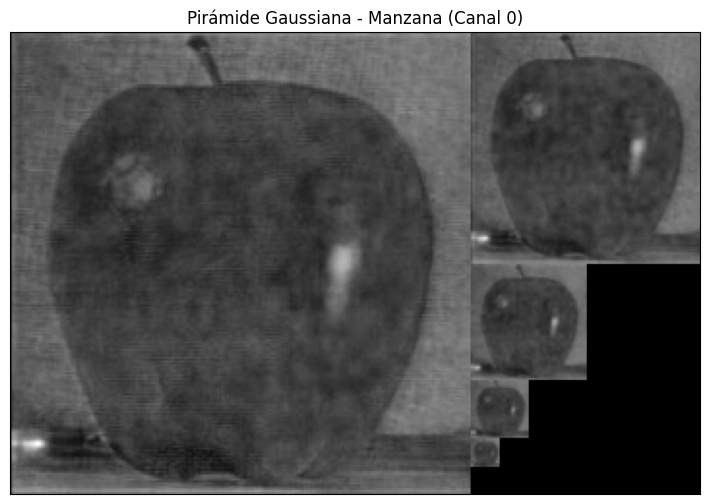

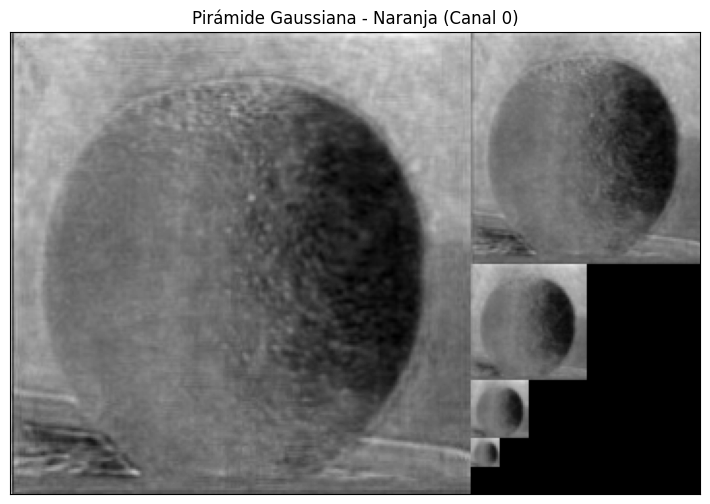

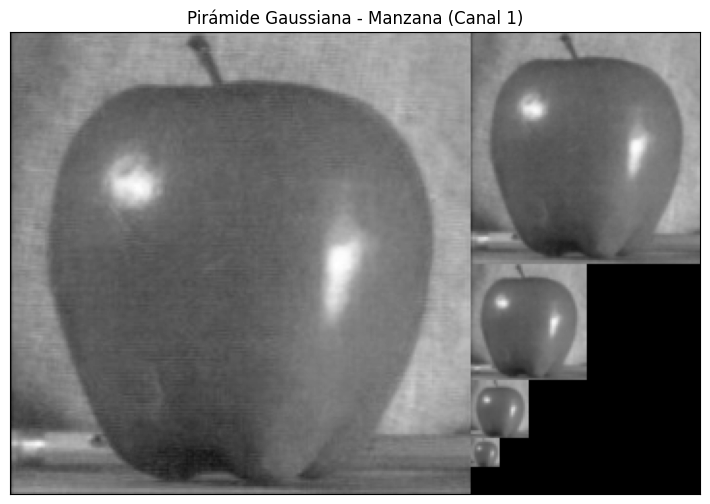

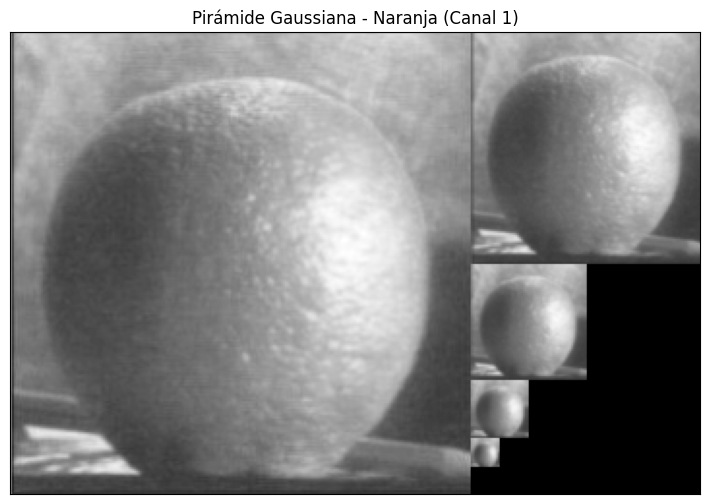

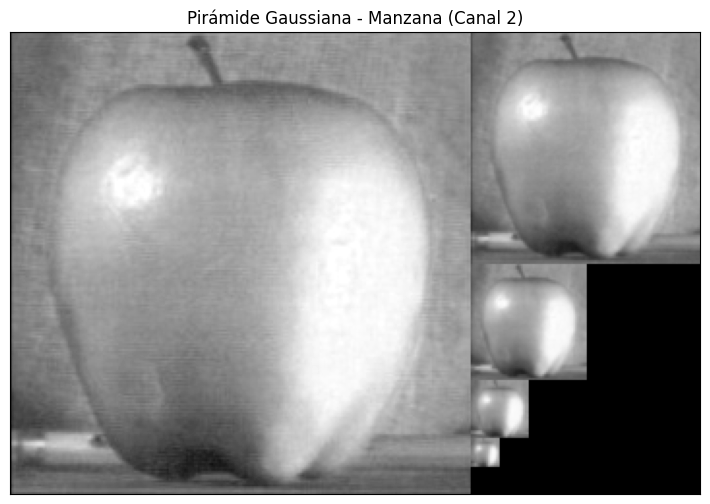

...

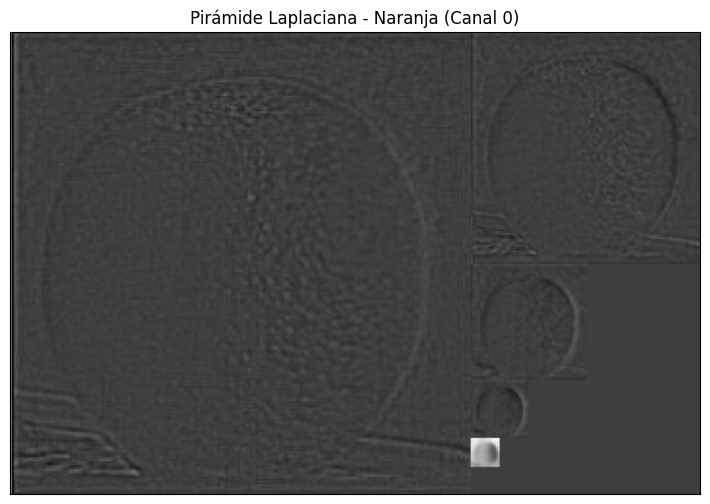

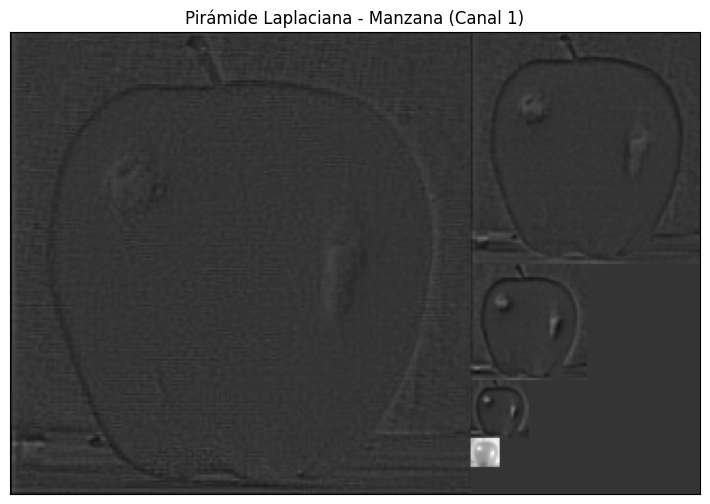

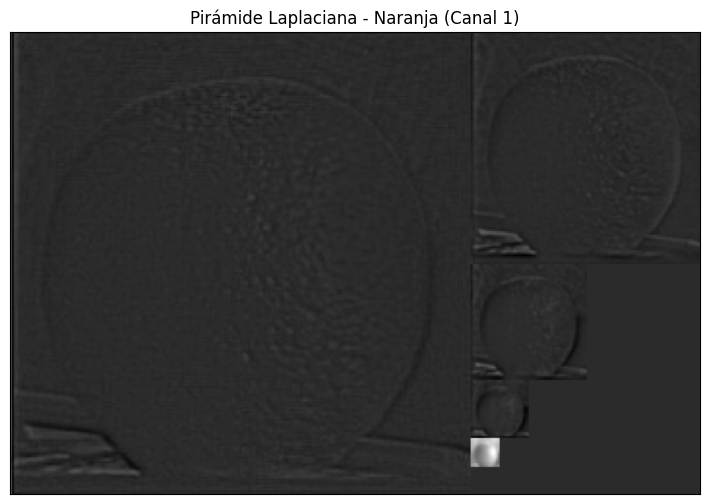

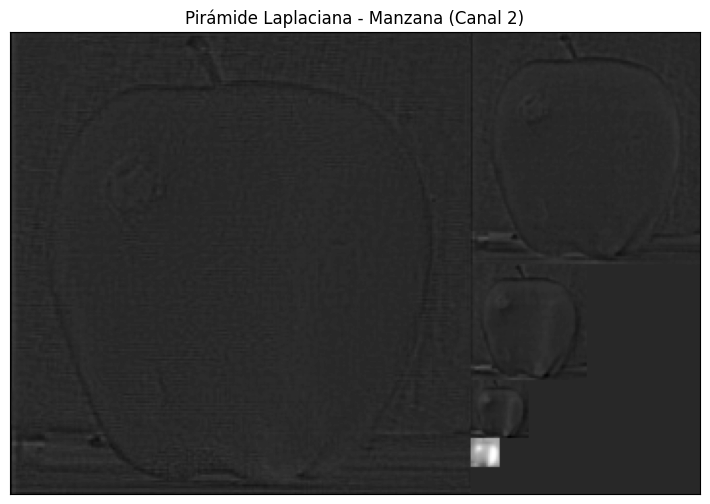

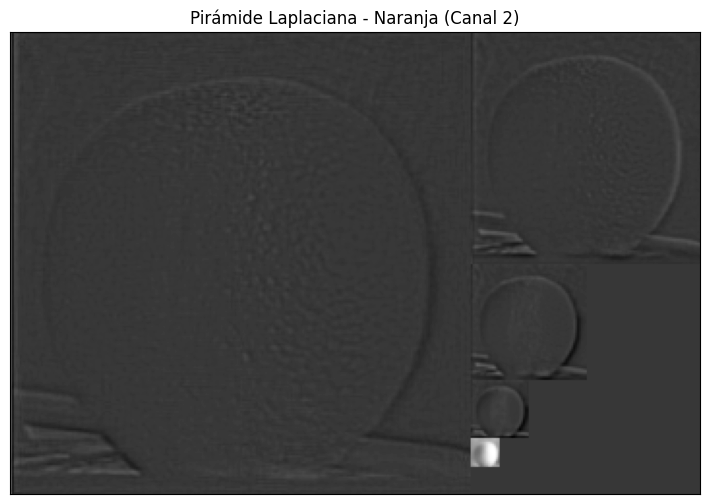

Reconstrucción del canal 0:


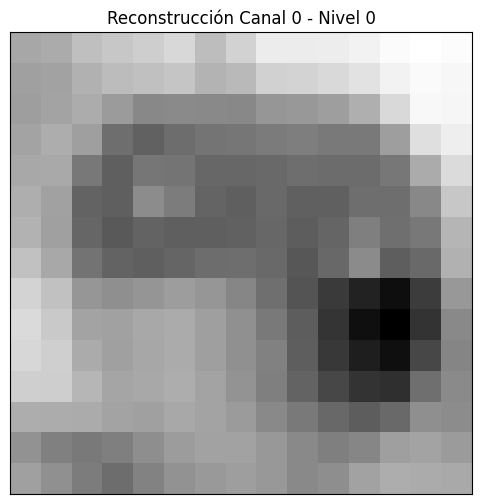

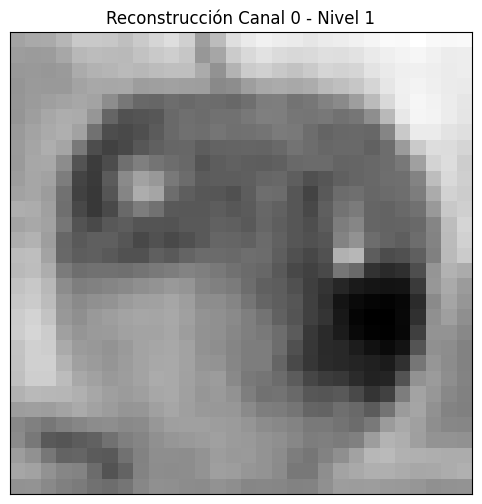

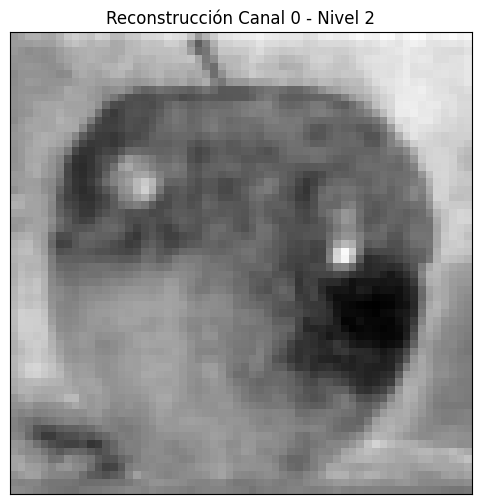

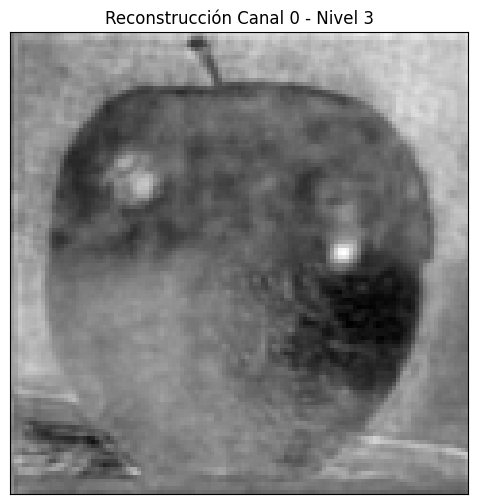

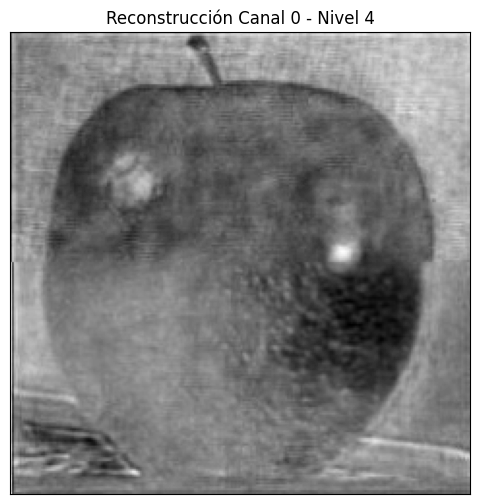

Reconstrucción del canal 1:


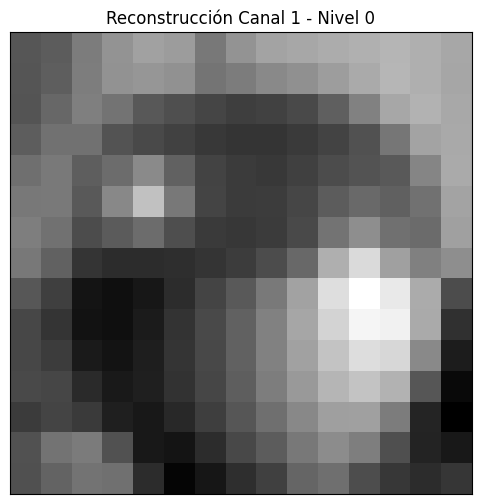

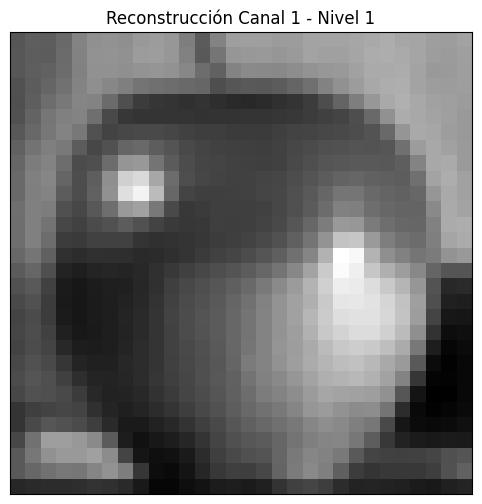

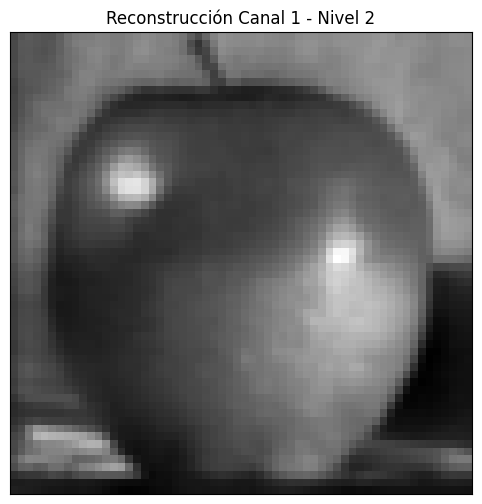

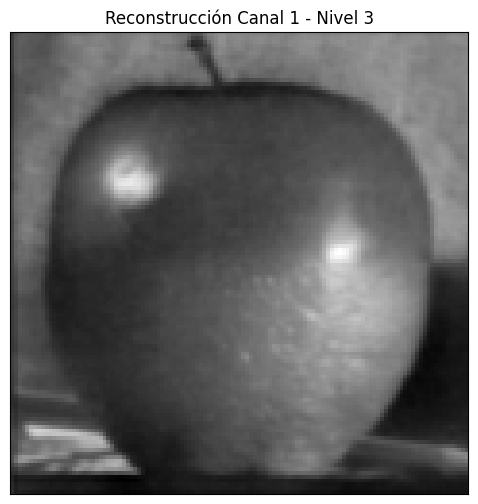

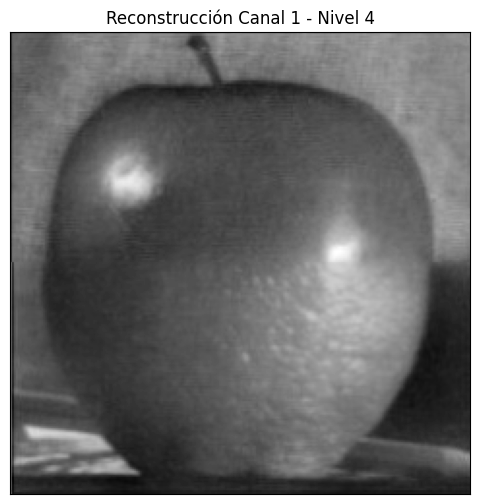

Reconstrucción del canal 2:


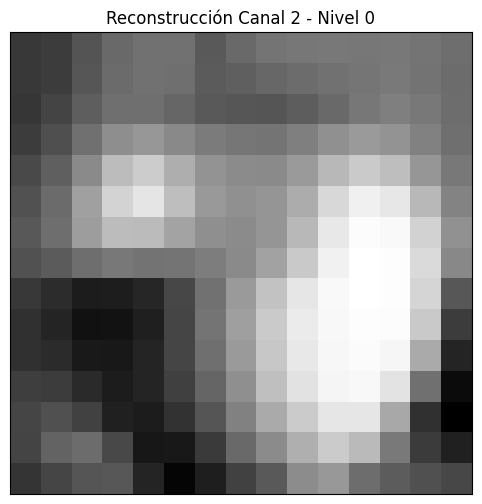

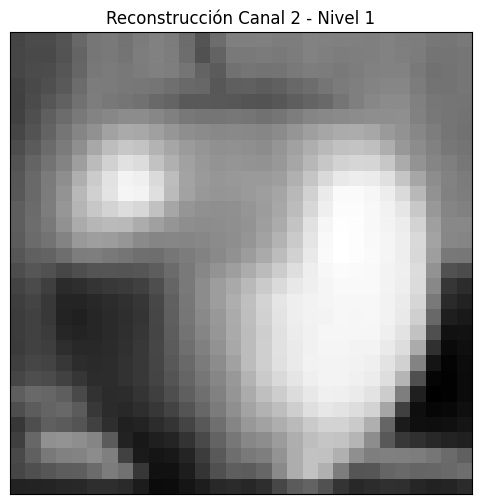

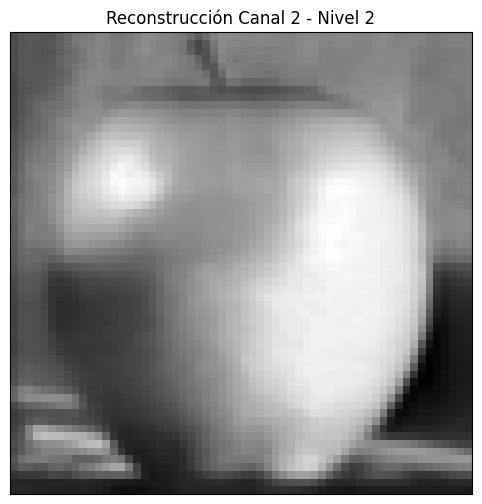

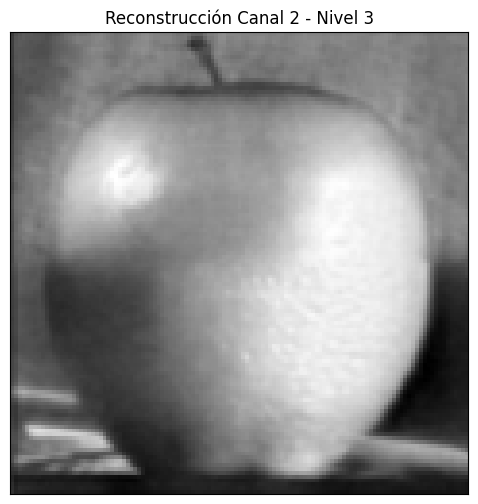

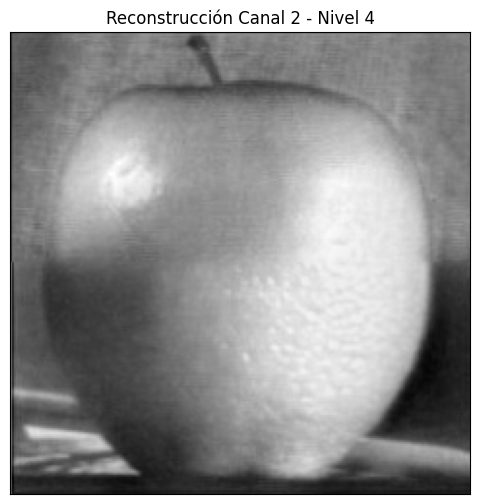

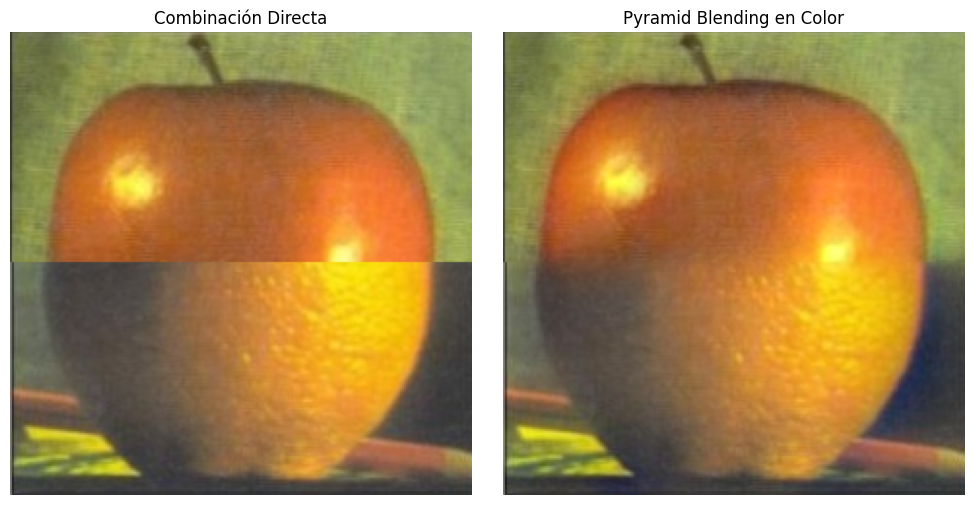

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def mezclarPiramidesLap(lapA, lapB, mascaraGauss):
    piramide_mezclada = []
    for la, lb, gm in zip(lapA, lapB, mascaraGauss):
        mezclada = gm * la + (1 - gm) * lb
        piramide_mezclada.append(mezclada)
    return piramide_mezclada

def reconstruirImagen(piramide_laplaciana):
    imagen = piramide_laplaciana[-1]
    pasos_reconstruccion = [imagen]  # Para guardar las imágenes intermedias
    for i in range(len(piramide_laplaciana) - 2, -1, -1):
        imagen = cv2.pyrUp(imagen, dstsize=(piramide_laplaciana[i].shape[1], piramide_laplaciana[i].shape[0]))
        imagen = cv2.add(imagen, piramide_laplaciana[i])
        pasos_reconstruccion.append(imagen)  # Guardar la imagen intermedia
    return pasos_reconstruccion  # Devolver todas las imágenes intermedias
# Leer imágenes a color
manzana = cv2.imread('apple.jpg')
naranja = cv2.imread('orange.jpg')

# Asegurarse de que ambas imágenes tengan el mismo tamaño
naranja = cv2.resize(naranja, (manzana.shape[1], manzana.shape[0]))

# Separar en canales (R, G, B)
canales_manzana = cv2.split(manzana)
canales_naranja = cv2.split(naranja)

# Parámetros
n_niveles = 4
tamano_mascara = 7

# Generar pirámides gaussianas para cada canal
piramides_gauss_manzana = [pyramidGauss(ch, nlevel=n_niveles) for ch in canales_manzana]
piramides_gauss_naranja = [pyramidGauss(ch, nlevel=n_niveles) for ch in canales_naranja]

# Mostrar pirámides gaussianas
for i, (gauss_manzana, gauss_naranja) in enumerate(zip(piramides_gauss_manzana, piramides_gauss_naranja)):
    displayPyramid(gauss_manzana, title=f'Pirámide Gaussiana - Manzana (Canal {i})')
    displayPyramid(gauss_naranja, title=f'Pirámide Gaussiana - Naranja (Canal {i})')

# Generar pirámides laplacianas para cada canal
lap_manzana_canales = [pyramidLap(ch, nlevel=n_niveles) for ch in canales_manzana]
lap_naranja_canales = [pyramidLap(ch, nlevel=n_niveles) for ch in canales_naranja]

# Mostrar pirámides laplacianas
for i, (lap_manzana, lap_naranja) in enumerate(zip(lap_manzana_canales, lap_naranja_canales)):
    displayPyramid(lap_manzana, title=f'Pirámide Laplaciana - Manzana (Canal {i})')
    displayPyramid(lap_naranja, title=f'Pirámide Laplaciana - Naranja (Canal {i})')

# Generar la pirámide gaussiana de la máscara
mascara = np.zeros_like(canales_manzana[0], dtype=np.float32)
mascara[:mascara.shape[0] // 2, :] = 1  # 1 en la parte de la manzana (superior), 0 en la parte de la naranja (inferior)
mascara_gauss = pyramidGauss(mascara, nlevel=n_niveles)

# Mezclar las pirámides laplacianas para cada canal usando la máscara
piramides_mezcladas_canales = [
    mezclarPiramidesLap(lap_manzana_canales[i], lap_naranja_canales[i], mascara_gauss)
    for i in range(3)  # Iterar para cada canal R, G y B
]

# Reconstruir la imagen combinada para cada canal y luego recomponer en una imagen final
imagenes_reconstruidas = []  # Para guardar las imágenes reconstruidas de cada canal
for bp in piramides_mezcladas_canales:
    imagenes_reconstruidas.append(reconstruirImagen(bp))

# Mostrar las imágenes intermedias de la reconstrucción
for canal_idx in range(3):  # Para cada canal R, G y B
    print(f"Reconstrucción del canal {canal_idx}:")
    for nivel, imagen in enumerate(imagenes_reconstruidas[canal_idx]):
        displayIm(imagen, title=f'Reconstrucción Canal {canal_idx} - Nivel {nivel}')

# Asegúrate de que los valores de la imagen estén en el rango [0, 255]
canales_mezclados = [
    np.clip(canal[-1], 0, 255).astype(np.uint8) for canal in imagenes_reconstruidas  # Tomar el último elemento (imagen final)
]

# Reconstruir la imagen final a partir de los canales mezclados
imagen_mezclada = cv2.merge(canales_mezclados)  # Combinar los canales en una sola imagen

# Comparar con una combinación directa de las imágenes
mezcla_directa = np.vstack((manzana[:manzana.shape[0] // 2, :], naranja[naranja.shape[0] // 2:, :]))  # Cambiado a vstack

# Mostrar la combinación directa y la imagen final
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Combinación Directa')
plt.imshow(cv2.cvtColor(mezcla_directa, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Pyramid Blending en Color')
plt.imshow(cv2.cvtColor(imagen_mezclada, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()


#Comparación con la combinación directa de píxeles
Si simplemente combinamos la mitad superior de la imagen de la manzana con la mitad inferior de la imagen de la naranja (sin blending), el resultado es una transición abrupta y notoria en la línea de separación de ambas mitades. Esto genera una línea divisoria clara, y los bordes resultan poco naturales, rompiendo la integración visual.

En cambio, la Pyramid Blending produce una fusión gradual y suave entre ambas mitades. La técnica asegura que los detalles de ambas imágenes se mezclen de forma progresiva, haciendo que la transición parezca natural y sin bordes visibles.